In [152]:
import sys
from pathlib import Path

script_path = Path.cwd().parent / 'gpr'
sys.path.append(str(script_path))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

import seaborn as sb
import corner

import anal_helpers as anal
import prepare_ceft as pc

import post_anal as pa


from aquarel import load_theme
theme = (
        load_theme("gruvbox_dark")
        .set_font("serif")
        .set_grid(True, width=0.2)
        )

theme.apply()


def get_stats(arr):
    mean = np.nanmean(arr, axis=0)
    p16 = np.nanpercentile(arr, 16, axis=0)
    p84 = np.nanpercentile(arr, 84, axis=0)
    p025 = np.nanpercentile(arr, 2.5, axis=0)
    p975 = np.nanpercentile(arr, 97.5, axis=0)
    return mean, p16, p84, p025, p975

n_ceft, cs2_ceft, cs2_l, cs2_u = anal.get_ceft_cs2()

note:

energy densities are not all equal that is eos[0][0] is not equal to eos[0][-1]

so when i plot the quartiles, i must get quartiles of the energy density as well.

# old stuff

In [16]:
eos_file = "/home/sam/thesis/code/results/eos_samples/old_SE_10ns_1/SE_10ns_1_eos.npy"
eos = np.load(eos_file)

mr_file = "/home/sam/thesis/code/results/tov_res/old_SE_10ns_1/SE_10ns_1_tidal.npy"
mr = np.load(mr_file)
r = mr[0]
m = mr[1]
tide = mr[2]
press_cent = mr[3]

edens = eos[0]
press = eos[1]
cs2 = eos[2]

In [17]:
filepath = "/home/sam/thesis/code/results/nmma/old_SE_10ns_1/GW170817_samples.parquet"

In [18]:
df = pd.read_parquet(filepath)

In [19]:
df["EOS"] = np.int64(np.floor(df["EOS"]))

In [20]:
df

,chirp_mass,mass_ratio,a_1,a_2,tilt_1,tilt_2,phi_12,phi_jl,luminosity_distance,cos_theta_jn,psi,phase,geocent_time,EOS
0,1.197313,0.884563,0.025587,0.016213,1.813921,2.531744,4.714963,3.291274,40.392490,-0.912148,3.095519,1.316209,1.187009e+09,7933
1,1.197329,0.816835,0.047455,0.020644,2.049946,1.133639,6.130566,0.325919,45.382392,-0.963848,1.646706,3.328569,1.187009e+09,4942
2,1.197451,0.817194,0.027839,0.002163,1.742535,0.468510,5.313243,0.198937,30.060942,-0.552477,0.164227,5.258109,1.187009e+09,1628
3,1.197396,0.912910,0.028584,0.016782,2.818172,0.764094,5.373189,0.571774,49.110183,-0.990868,1.530361,3.356675,1.187009e+09,6796
4,1.197548,0.874658,0.000086,0.002858,1.797877,1.726787,1.070928,0.783620,46.876586,-0.971361,3.065071,5.267626,1.187009e+09,4555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4819,1.197538,0.585693,0.043432,0.047709,0.743524,0.484679,3.254848,0.115949,37.777528,-0.792760,0.391560,5.309136,1.187009e+09,9583
4820,1.197459,0.722183,0.033186,0.039347,1.705853,0.878096,5.212123,3.923869,36.994887,-0.781923,0.248834,5.267974,1.187009e+09,9714
4821,1.197437,0.758927,0.009494,0.001653,1.045604,2.358857,5.268792,0.214717,21.643213,-0.463777,0.103282,5.146952,1.187009e+09,7785
4822,1.197602,0.577095,0.047833,0.047772,0.086458,1.013231,4.902834,5.817384,44.234980,-0.929512,0.366172,5.460060,1.187009e+09,4878


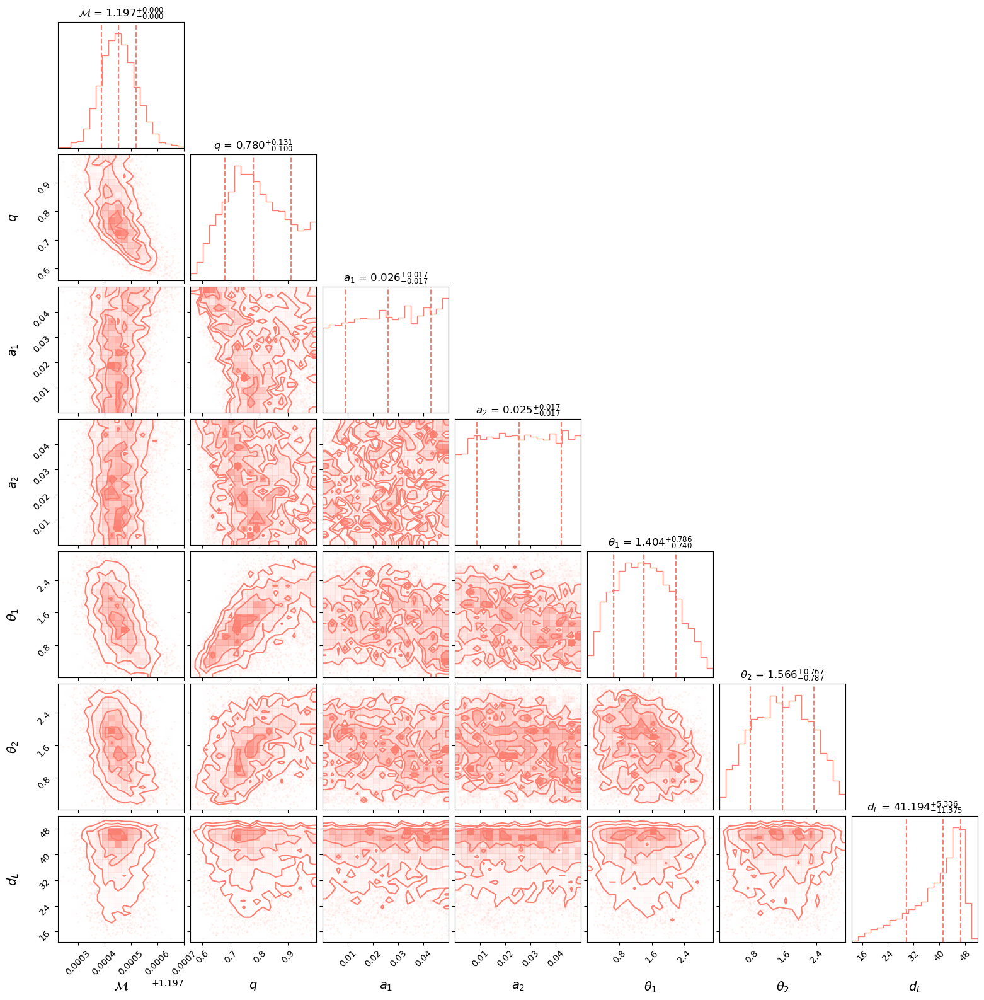

In [21]:
params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)

plt.show()

In [22]:
valid_eos = []
for i in df["EOS"]:
    valid_eos.append(i)

In [ ]:
m_14 = []
r_14 = []
pc_14 = []
ec_14 = []

for i in range(len(r)):
    valid_mask = ~np.isnan(m[i]) & ~np.isnan(r[i])
    m_valid = m[i][valid_mask]
    r_valid = r[i][valid_mask]
    pc_valid = press_cent[i][valid_mask]
    edens_valid = edens[i]
    press_valid = press[i]

    if len(m_valid) > 1 and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid)): # if eos reaches 1.4
        r_interp = np.interp(1.4, m_valid, r_valid)
        r_14.append(r_interp)
        pc_interp = np.interp(1.4, m_valid, pc_valid)
        pc_14.append(pc_interp)
        ec_interp = np.interp(pc_interp, press_valid, edens_valid)
        ec_14.append(ec_interp)
    else:
        r_14.append(np.nan)
        pc_14.append(np.nan)
        ec_14.append(np.nan)
        
r_14 = np.asarray(r_14)
pc_14 = np.asarray(pc_14)
ec_14 = np.asarray(ec_14)

df["r_1.4"] = r_14[valid_eos]
df["pc_1.4"] = pc_14[valid_eos]
df["ec_1.4"] = ec_14[valid_eos]


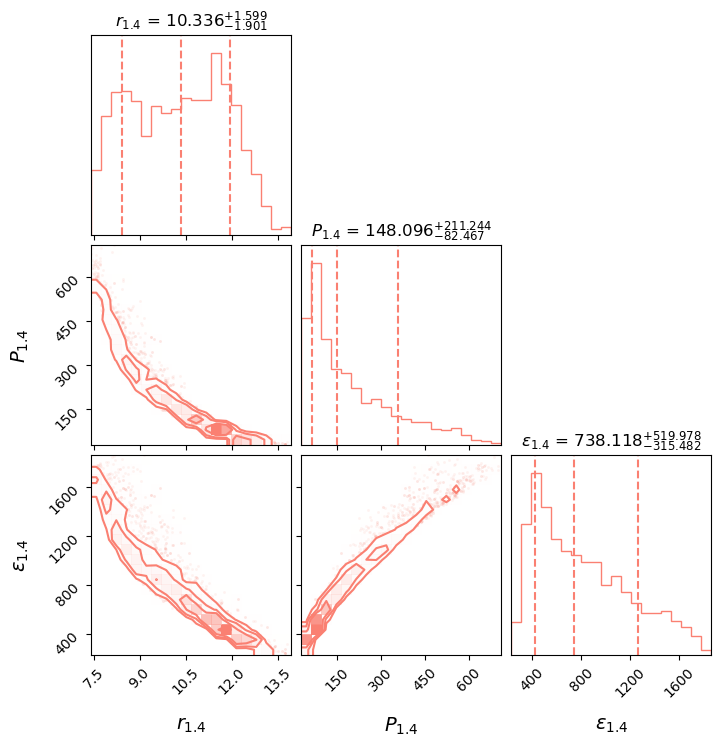

In [ ]:
params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$"
]

df_clean = df[params_to_plot].dropna()

figure = corner.corner(
    df_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.title("")
plt.show()

$$M_c = \frac{(m_1 m_2)^{3/5}}{(m_1 + m_2)^{1/5}}$$

$$q = m_1/m_2$$

$$M = m_1 + m_2$$

$$\mu = \frac{m_1m_2}{M}$$

$$m_1 = q m_2$$

$$m_1 m_2 = qm_2*m_2$$

$$M = m_1 + m_2 = q m_2 + m_2 = (q + 1) m_2$$

$$M_c = \frac{(q m_2^2)^{3/5}}{M^{1/5}}$$
$$M_c = \frac{(q m_2^2)^{3/5}}{((q + 1) m_2)^{1/5}}$$
$$M_c = \frac{(q^{3/5} m_2^{6/5})}{((q + 1)^{1/5} m_2^{1/5})}$$
$$M_c \frac{(q+1)^{1/5}}{q^{3/5}} = m_2^{6/5-1/5}$$
$$m_2 = M_c \frac{(q+1)^{1/5}}{q^{3/5}}$$
$$m_1 = q m_2 = q M_c \frac{(q+1)^{1/5}}{q^{3/5}} = M_c (q+1)^{1/5} q^{2/5}$$


chirp_mass * (1 + mass_ratio) ** 1.2 / mass_ratio ** 0.6:

$$M = M_c  \frac{(1+q)^{6/5}} {q^{3/5}}$$


$$m_1 + m_2 = M_c (q+1)^{1/5} q^{2/5} + M_c \frac{(q+1)^{1/5}}{q^{3/5}} = M_c (q+1)^{1/5} (\frac{1}{q^{3/5}} + q^{2/5}) = M_c(q+1)^{1/5}\frac{q+1}{q^{3/5}} = M_c \frac{(q+1)^{6/5}}{q^{3/5}}$$

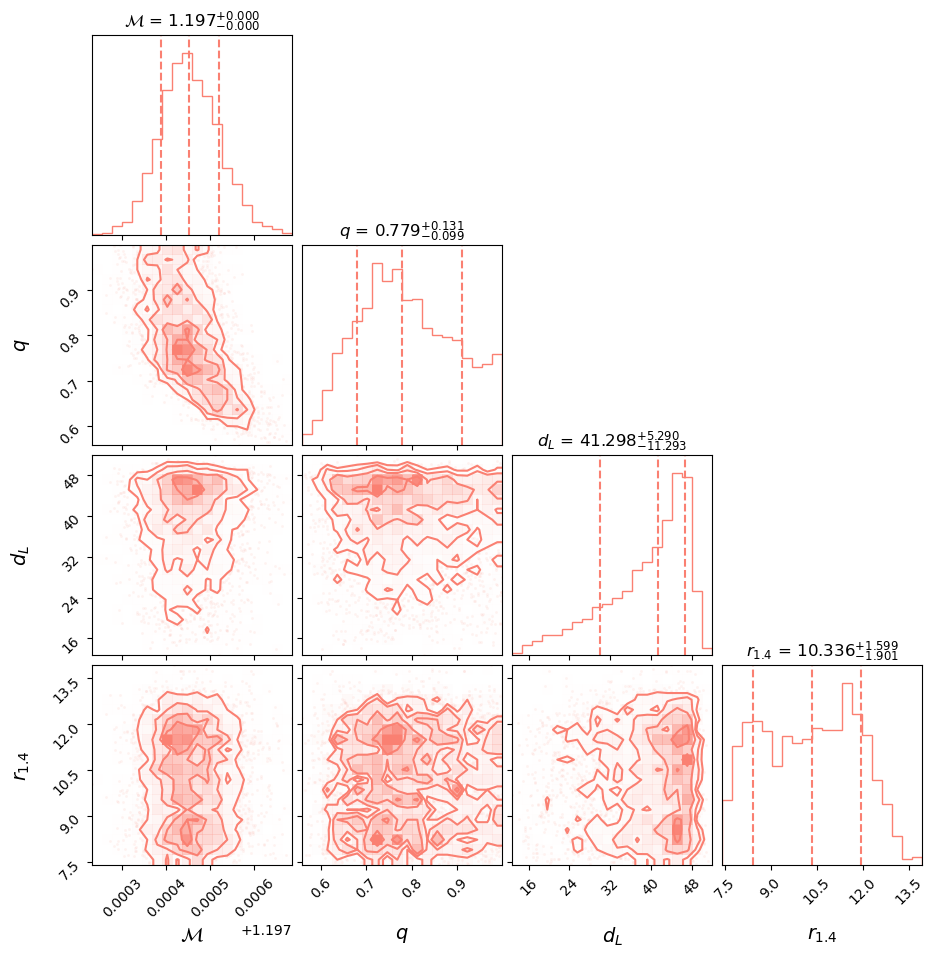

In [12]:
params_to_plot = [
    "chirp_mass", "mass_ratio", "luminosity_distance", "r_1.4"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$d_L$", r"$r_{1.4}$"
]

df_clean = df[params_to_plot].dropna()

figure = corner.corner(
    df_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)

plt.show()

In [18]:
n = anal.get_n_test(10, 200)
n_ceft, _, cs2_l, cs2_u = anal.get_ceft_cs2()

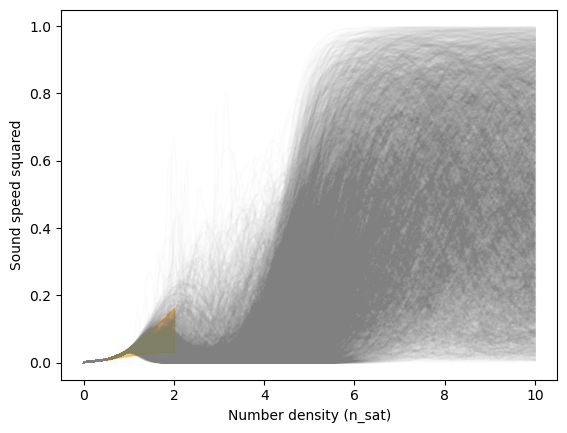

In [19]:
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(n, eos[2][i], color='grey', alpha=0.02)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.show()


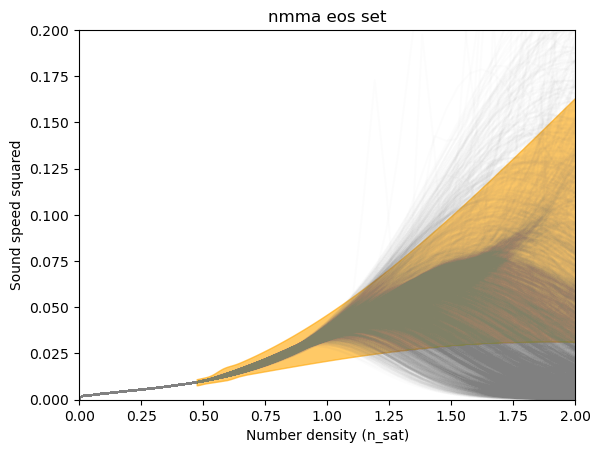

In [20]:
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(n, eos[2][i], color='grey', alpha=0.02)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.ylim(0,0.2)
plt.xlim(0,2)
plt.title("nmma eos set")
plt.show()


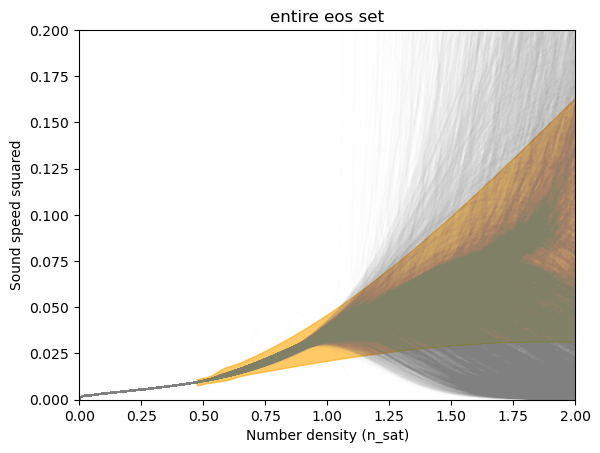

In [21]:
for i in range(len(eos[0])):
    plt.plot(n, eos[2][i], color='grey', alpha=0.01)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.ylim(0,0.2)
plt.xlim(0,2)
plt.title("entire eos set")
plt.show()


In [45]:
_, e, el, eu = anal.get_ceft_e()
_, p, pl, pu = anal.get_ceft_p()

In [ ]:
from aquarel import load_theme
theme = (
        load_theme("gruvbox_dark")
        .set_font("serif")
        .set_grid(True, width=0.2)
        )


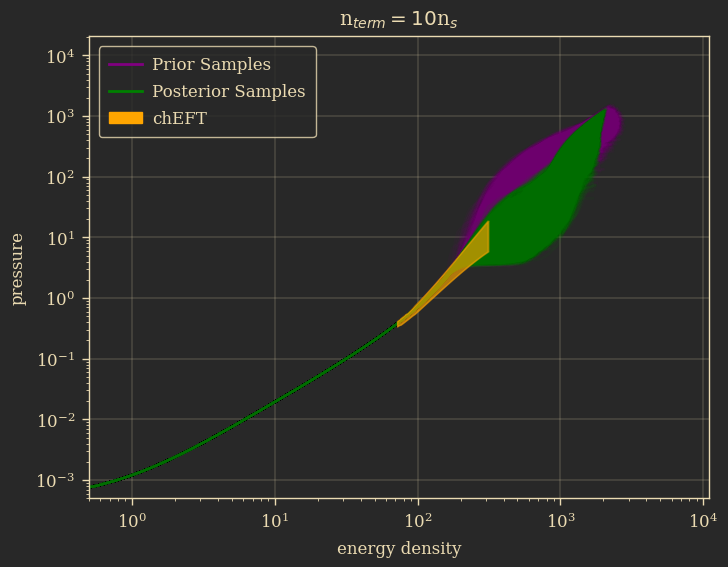

In [120]:
theme.set_legend(location="upper left")
theme.apply()

plt.figure(figsize=(8, 6)) 
for i in range(len(eos[0])):
    if i not in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.05)
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.05)

plt.fill_between(el, pl, pu, color = "orange", alpha=0.4, zorder=10)
plt.fill_between(eu, pl, pu, color = "orange", alpha=0.4, zorder=10)

legend_elements = [
    Line2D([0], [0], color='purple', lw=2, alpha=1, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, alpha=1, label='Posterior Samples'),
     Patch(facecolor='orange', edgecolor='orange', alpha=1, label='chEFT')
]
handles, labels = plt.gca().get_legend_handles_labels()
all_handles = handles + legend_elements
all_labels = labels + [item.get_label() for item in legend_elements]

plt.yscale("log")
plt.xscale("log")
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title(r"n$_{term} = 10$n$_s$")
plt.xlim(0.5,)
plt.ylim(5e-4,)
plt.legend(handles=all_handles, labels=all_labels)
theme.apply_transforms()
plt.show()


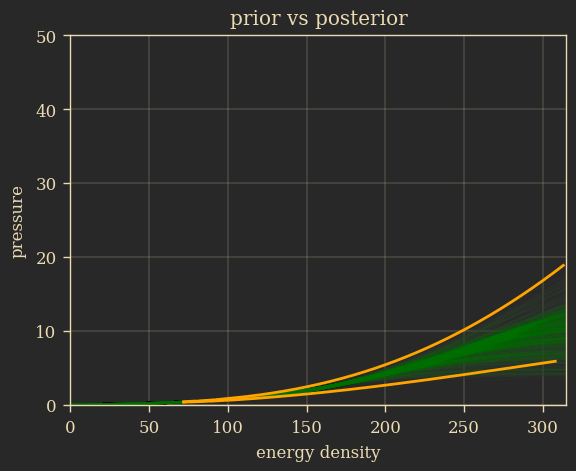

In [82]:
theme.apply()
for i in range(500):
    plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.05)
for i in range(500):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.05)
plt.plot(el, pl, color='orange')
plt.plot(eu, pu, color='orange', label='chEFT')
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title("prior vs posterior")
plt.xlim(0,315)
plt.ylim(0,50)
theme.apply_transforms()
plt.show()

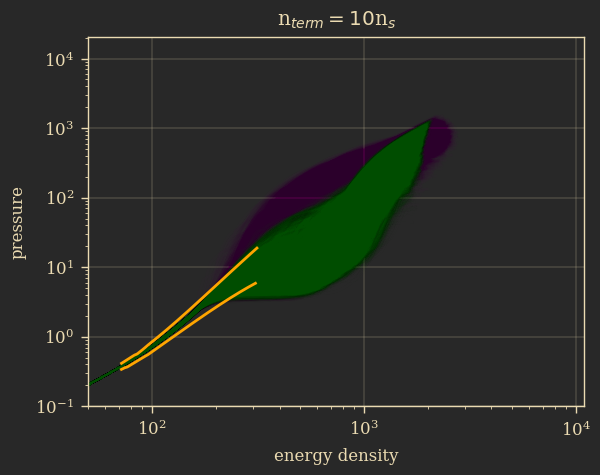

In [118]:
theme.apply()
for i in range(len(eos[0])):
    plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.01)
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.02)
plt.plot(el, pl, color='orange')
plt.plot(eu, pu, color='orange', label='chEFT')
plt.yscale("log")
plt.xscale("log")
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title(r"n$_{term} = 10$n$_s$")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

# SE

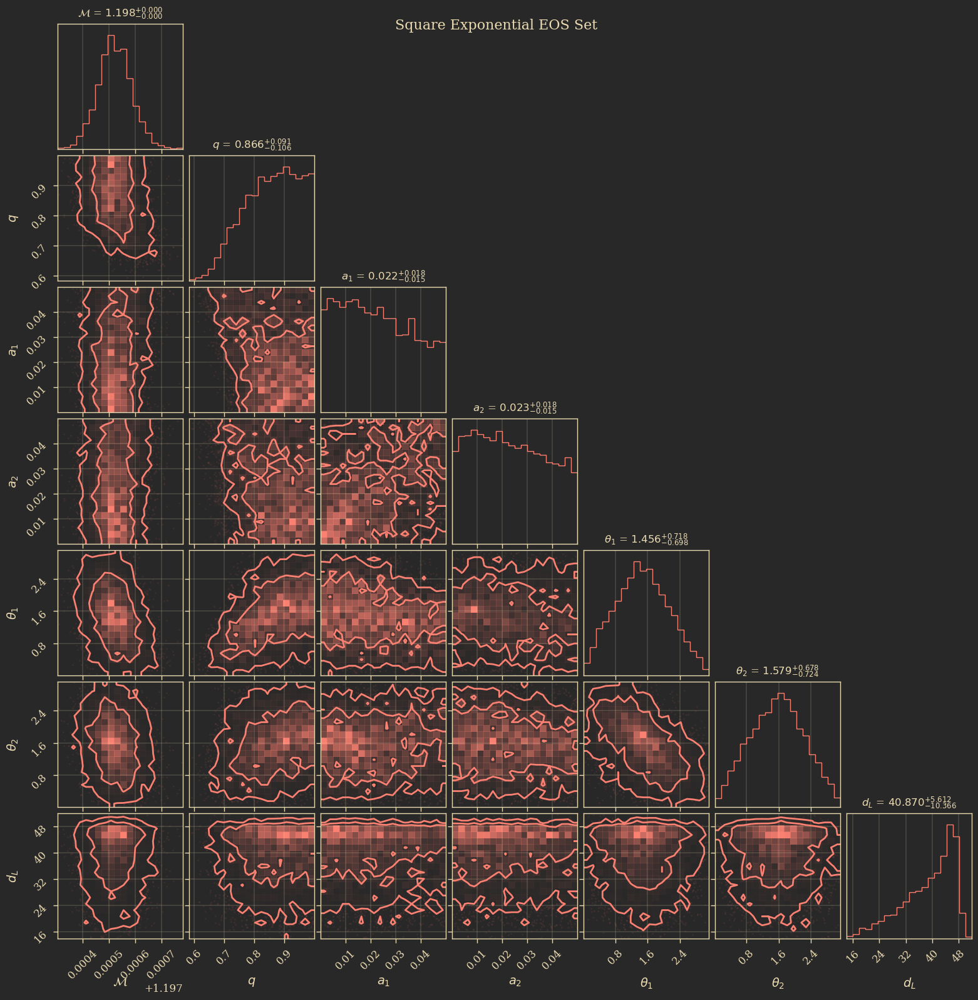

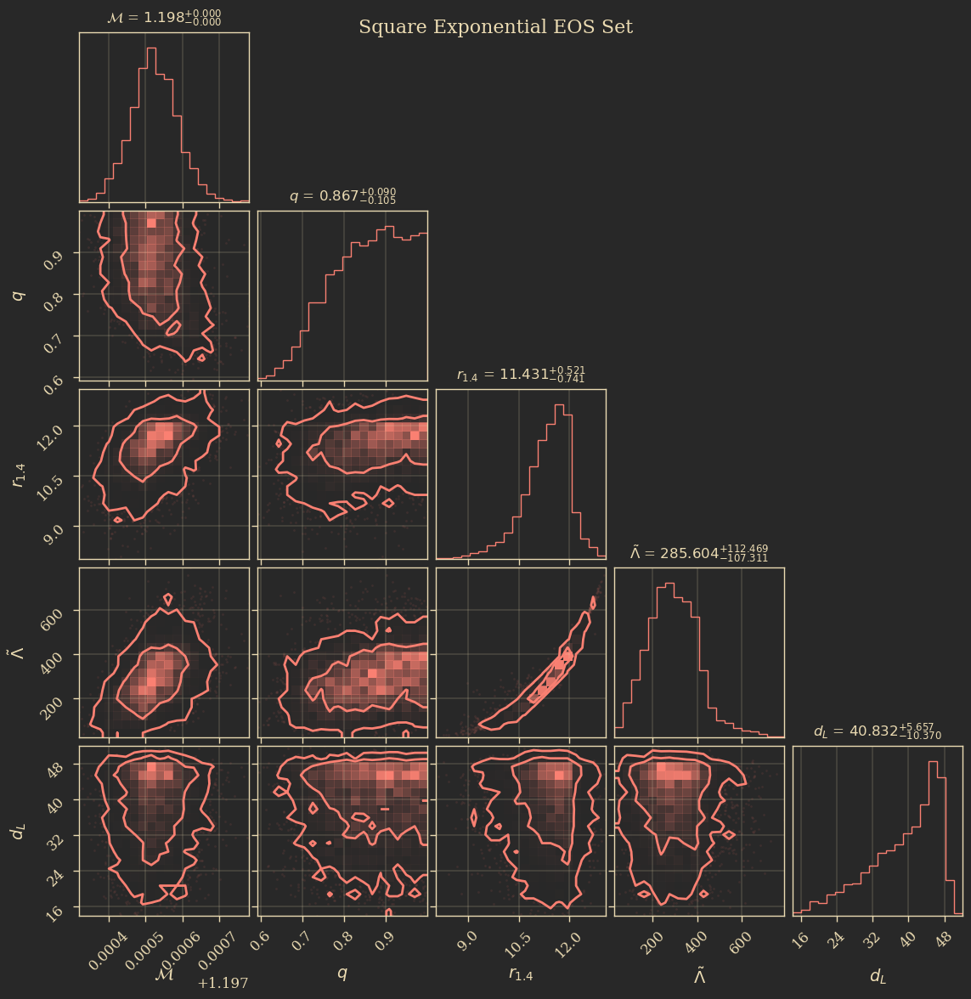

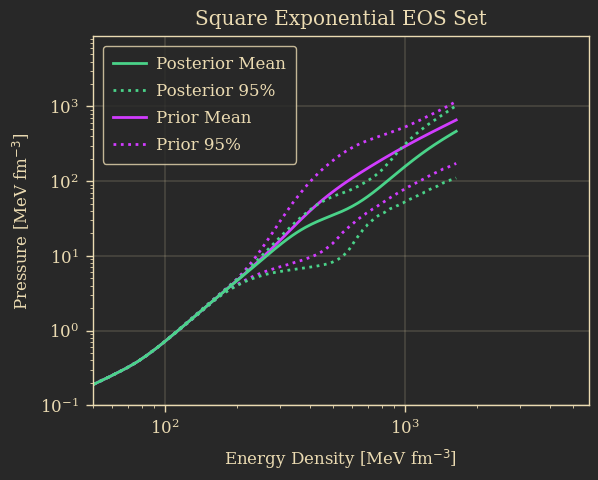

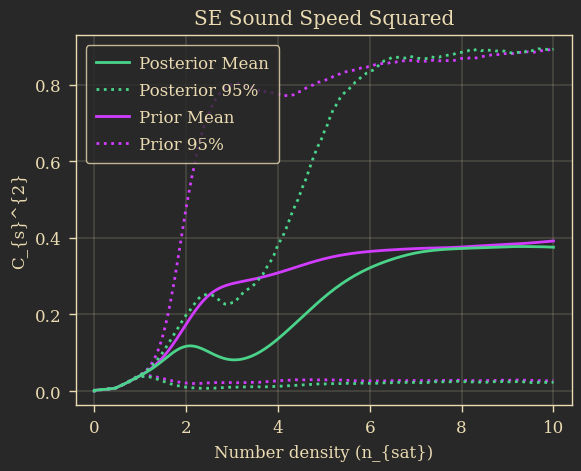

In [5]:
df_se = pa.load_results('SE_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df_se[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Square Exponential EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()

params_to_plot = [
   "chirp_mass", "mass_ratio", "r_1.4", "lam_tilde", "luminosity_distance"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$r_{1.4}$", r"$\tilde{\Lambda}$", r"$d_L$"]

df_se_clean = df_se[params_to_plot].dropna()

figure = corner.corner(
    df_se_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Square Exponential EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()

eos_se, mr_se = pa.load_eos_data('SE_10ns_1')

num_eos = len(eos_se[0])
""" for i in range(num_eos):
    plt.plot(eos_se[0][i], eos_se[1][i], color="#d13cff", alpha=0.02)
for i in range(num_eos):
    if i in df_se["EOS"]:
        plt.plot(eos_se[0][i], eos_se[1][i], color='#4ad389', alpha=0.02)

legend_handles = [
    Line2D([0], [0], color="#d13cff", lw=2, label='Prior Samples'),
    Line2D([0], [0], color='#4ad389', lw=2, label='Posterior Samples')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"SE")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)
for i in range(num_eos):
    plt.plot(n, eos_se[2][i], color='#d13cff', alpha=0.1)
for i in range(num_eos):
    if i in df_se["EOS"]:
        plt.plot(n, eos_se[2][i], color='#4ad389', alpha=0.02)
legend_handles = [
    Line2D([0], [0], color='#d13cff', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='#4ad389', lw=2, label='Posterior Samples')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE")
plt.show() """




mean_se, se_16, se_84, se_025, se_975 = get_stats(eos_se[1])

plt.plot(eos_se[0][0], mean_se, color="#d13cff", label='SE Mean')


# 95% bands
plt.plot(eos_se[0][0], se_025, color="#d13cff", ls=':', label='SE 95%')
plt.plot(eos_se[0][0], se_975, color="#d13cff", ls=':')

posterior_pressures_se = []

for i in range(num_eos):
    if i in df_se["EOS"]:
        posterior_pressures_se.append(eos_se[1][i])
  
posterior_pressures_se = np.array(posterior_pressures_se)


# Compute mean and 95% percentiles
mean_post_se = np.nanmean(posterior_pressures_se, axis=0)

p025_post_se = np.nanpercentile(posterior_pressures_se, 2.5, axis=0)
p975_post_se = np.nanpercentile(posterior_pressures_se, 97.5, axis=0)

# Plot mean and 95% band
plt.plot(eos_se[0][0], mean_post_se, color='#4ad389', label='SE Mean')
plt.plot(eos_se[0][0], p025_post_se, color='#4ad389', ls=':', label='SE 95%')
plt.plot(eos_se[0][0], p975_post_se, color='#4ad389', ls=':')


legend_handles = [
    Line2D([0], [0], color="#4ad389", label='Posterior Mean'),
    Line2D([0], [0], color="#4ad389", ls=':', label='Posterior 95%'),
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_se, cs2_16_se, cs2_84_se, cs2_025_se, cs2_975_se = get_stats(eos_se[2])
plt.plot(n, mean_cs2_se, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_se, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_se, color="#d13cff", ls=':')

# Posterior samples
posterior_cs2_se = []
for i in range(num_eos):
    if i in df_se["EOS"]:
        posterior_cs2_se.append(eos_se[2][i])
posterior_cs2_se = np.array(posterior_cs2_se)

# Posterior mean and 95% bands
mean_post_cs2_se = np.nanmean(posterior_cs2_se, axis=0)
p025_post_cs2_se = np.nanpercentile(posterior_cs2_se, 2.5, axis=0)
p975_post_cs2_se = np.nanpercentile(posterior_cs2_se, 97.5, axis=0)

plt.plot(n, mean_post_cs2_se, color='#4ad389', label='Posterior Mean')
plt.plot(n, p025_post_cs2_se, color='#4ad389', ls=':', label='Posterior 95%')
plt.plot(n, p975_post_cs2_se, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color='#4ad389', label='Posterior Mean'),
    Line2D([0], [0], color='#4ad389', ls=':', label='Posterior 95%'),
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

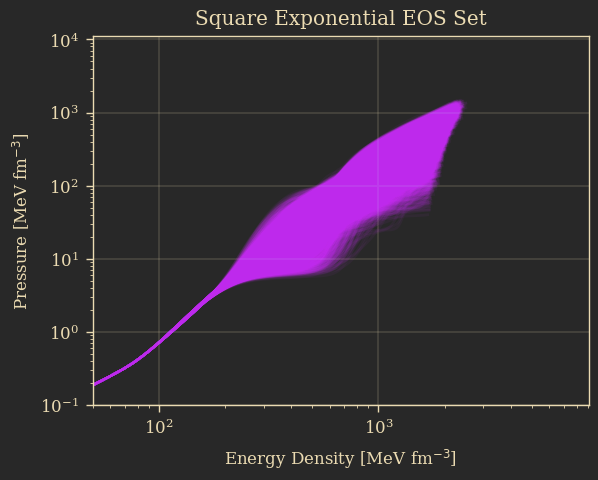

In [91]:
idx = []
for i in range(20000):
    sample_idx_dip = np.where((300 < eos_se[0][i]) & (eos_se[0][i] < 1000))[0]
    if len(np.where((eos_se[1][i][sample_idx_dip]<mean_se[sample_idx_dip]) == True)[0]) > len(eos_se[1][i][sample_idx_dip])/2:
        plt.plot(eos_se[0][i], eos_se[1][i], color="#d13cff", alpha=0.05)
        idx.append(i)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

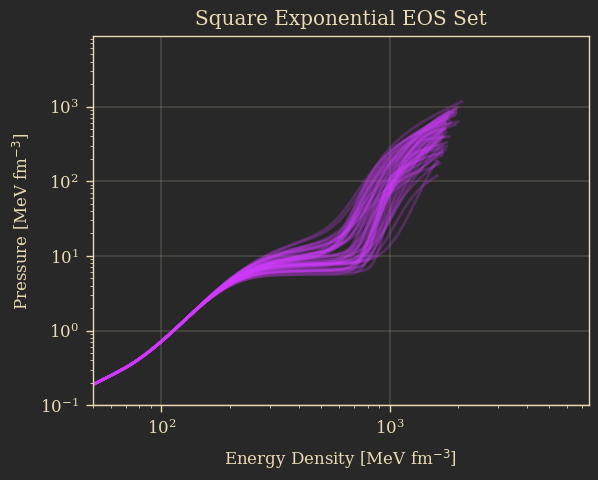

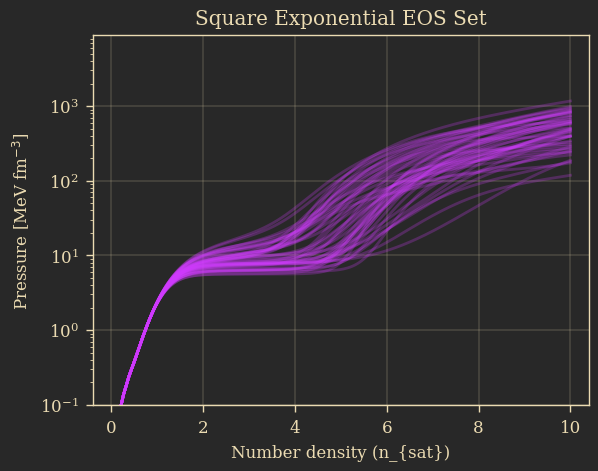

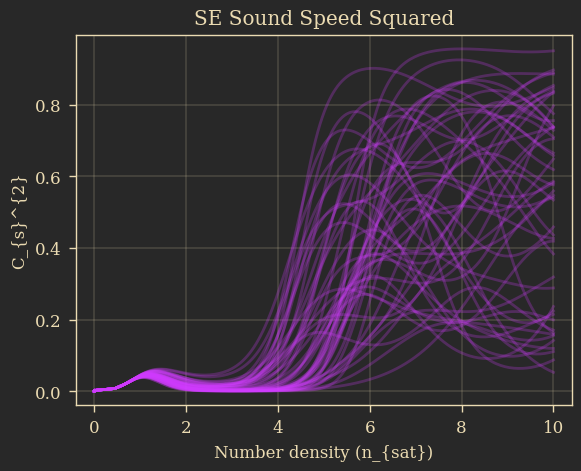

In [92]:
rands = np.random.choice(idx, 50)

for i in range(50):
    plt.plot(eos_se3[0][rands[i]], eos_se3[1][rands[i]], color="#d13cff", alpha=0.25)
    
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_se3[1][rands[i]], color="#d13cff", alpha=0.25)
    
plt.yscale("log")
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_se3[2][rands[i]], color="#d13cff", alpha=0.25)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.show()

# GE

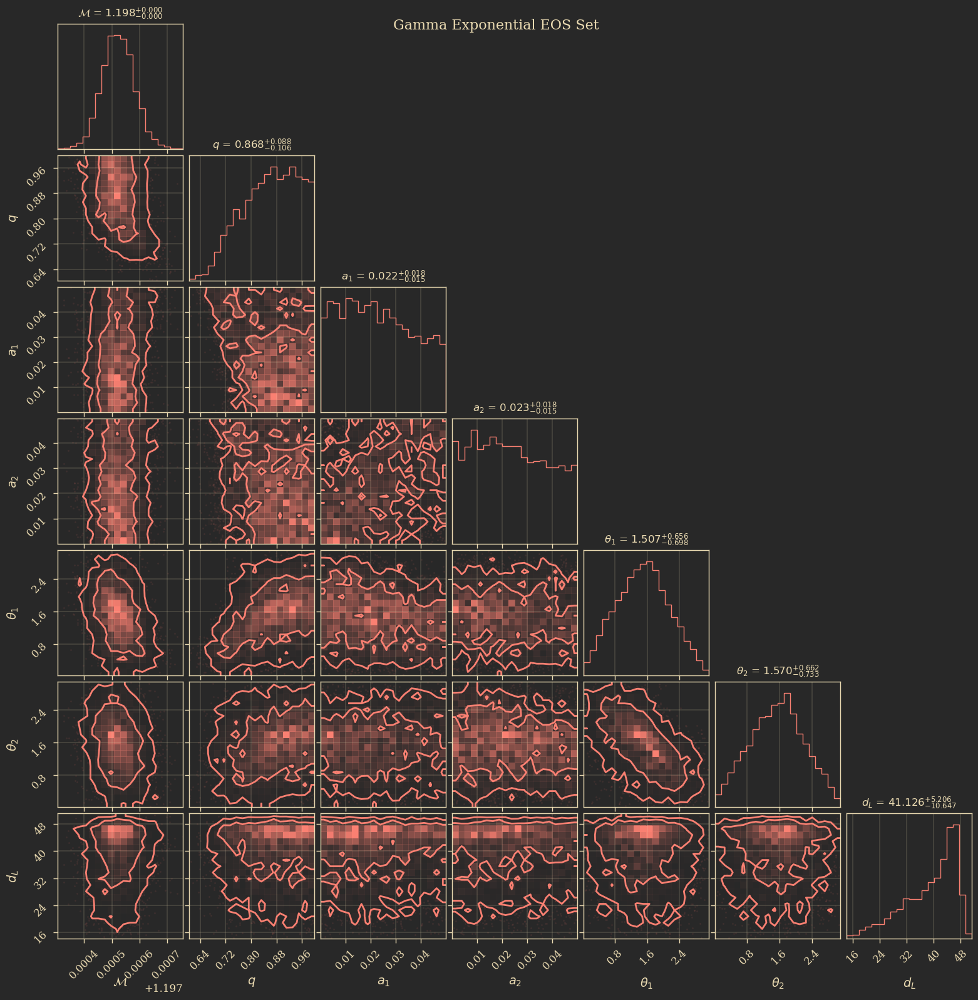

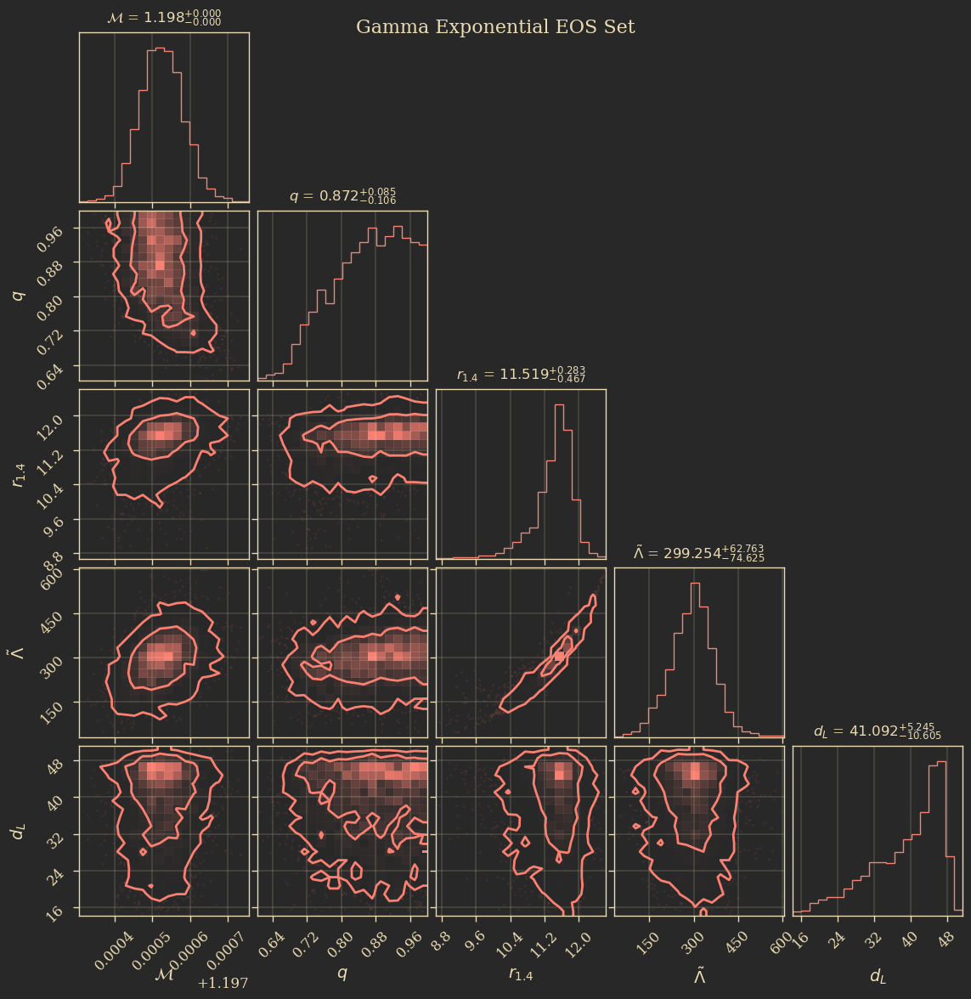

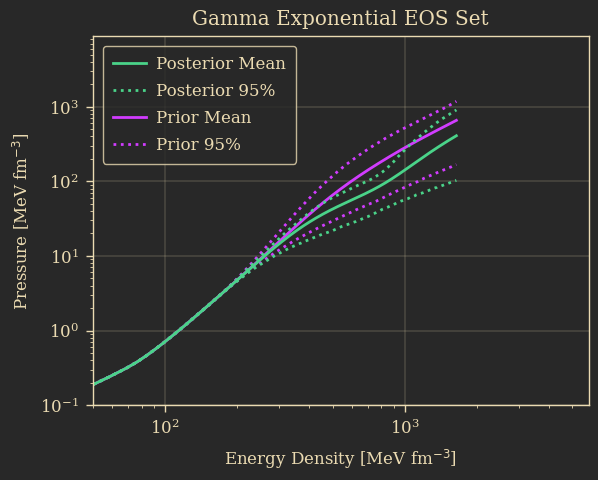

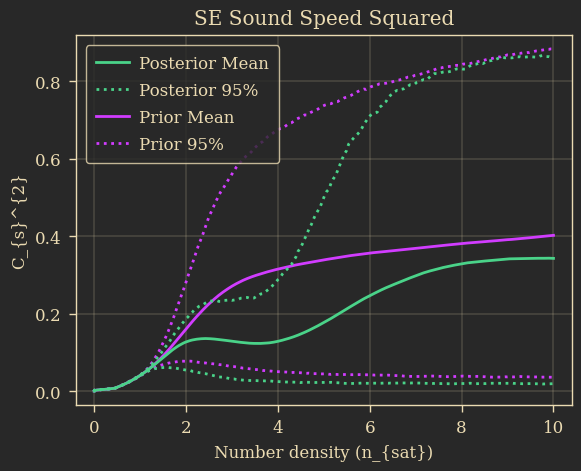

In [6]:
df_ge = pa.load_results('GE_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df_ge[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Gamma Exponential EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()

params_to_plot = [
   "chirp_mass", "mass_ratio", "r_1.4", "lam_tilde", "luminosity_distance"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$r_{1.4}$", r"$\tilde{\Lambda}$", r"$d_L$"]

df_ge_clean = df_ge[params_to_plot].dropna()

figure = corner.corner(
    df_ge_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Gamma Exponential EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()

eos_ge, mr_ge = pa.load_eos_data('GE_10ns_1')

num_eos = len(eos_ge[0])

mean_ge, ge_16, ge_84, ge_025, ge_975 = get_stats(eos_ge[1])

plt.plot(eos_ge[0][0], mean_ge, color="#d13cff", label='GE Mean')

# 95% bands
plt.plot(eos_ge[0][0], ge_025, color="#d13cff", ls=':', label='GE 95%')
plt.plot(eos_ge[0][0], ge_975, color="#d13cff", ls=':')

posterior_pressures_ge = []

for i in range(num_eos):
    if i in df_ge["EOS"]:
        posterior_pressures_ge.append(eos_ge[1][i])

posterior_pressures_ge = np.array(posterior_pressures_ge)

# Compute mean and 95% percentiles
mean_post_ge = np.nanmean(posterior_pressures_ge, axis=0)
p025_post_ge = np.nanpercentile(posterior_pressures_ge, 2.5, axis=0)
p975_post_ge = np.nanpercentile(posterior_pressures_ge, 97.5, axis=0)

# Plot mean and 95% band
plt.plot(eos_ge[0][0], mean_post_ge, color='#4ad389', label='GE Mean')
plt.plot(eos_ge[0][0], p025_post_ge, color='#4ad389', ls=':', label='GE 95%')
plt.plot(eos_ge[0][0], p975_post_ge, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color="#4ad389", label='Posterior Mean'),
    Line2D([0], [0], color="#4ad389", ls=':', label='Posterior 95%'),
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Gamma Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()


n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_ge, cs2_16_ge, cs2_84_ge, cs2_025_ge, cs2_975_ge = get_stats(eos_ge[2])
plt.plot(n, mean_cs2_ge, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_ge, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_ge, color="#d13cff", ls=':')

# Posterior samples
posterior_cs2_ge = []
for i in range(num_eos):
    if i in df_ge["EOS"]:
        posterior_cs2_ge.append(eos_ge[2][i])
posterior_cs2_ge = np.array(posterior_cs2_ge)

# Posterior mean and 95% bands
mean_post_cs2_ge = np.nanmean(posterior_cs2_ge, axis=0)
p025_post_cs2_ge = np.nanpercentile(posterior_cs2_ge, 2.5, axis=0)
p975_post_cs2_ge = np.nanpercentile(posterior_cs2_ge, 97.5, axis=0)

plt.plot(n, mean_post_cs2_ge, color='#4ad389', label='Posterior Mean')
plt.plot(n, p025_post_cs2_ge, color='#4ad389', ls=':', label='Posterior 95%')
plt.plot(n, p975_post_cs2_ge, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color='#4ad389', label='Posterior Mean'),
    Line2D([0], [0], color='#4ad389', ls=':', label='Posterior 95%'),
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

# M32

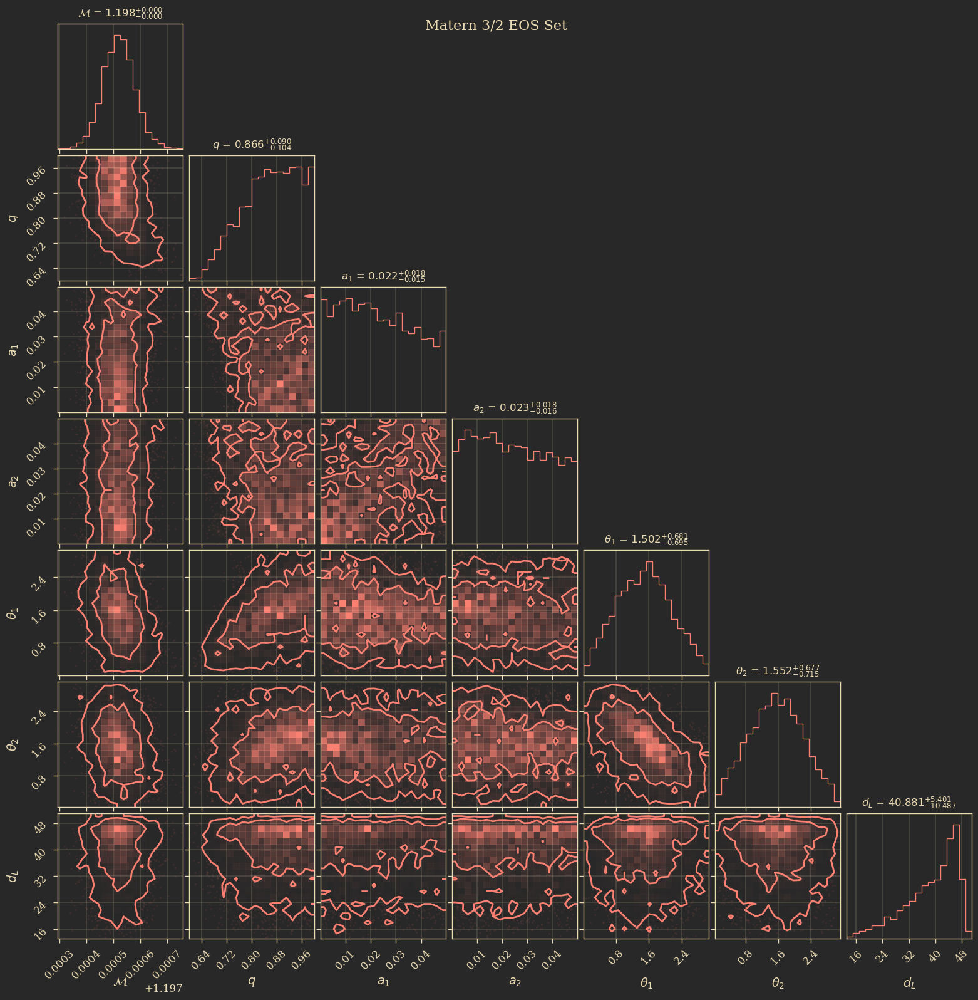

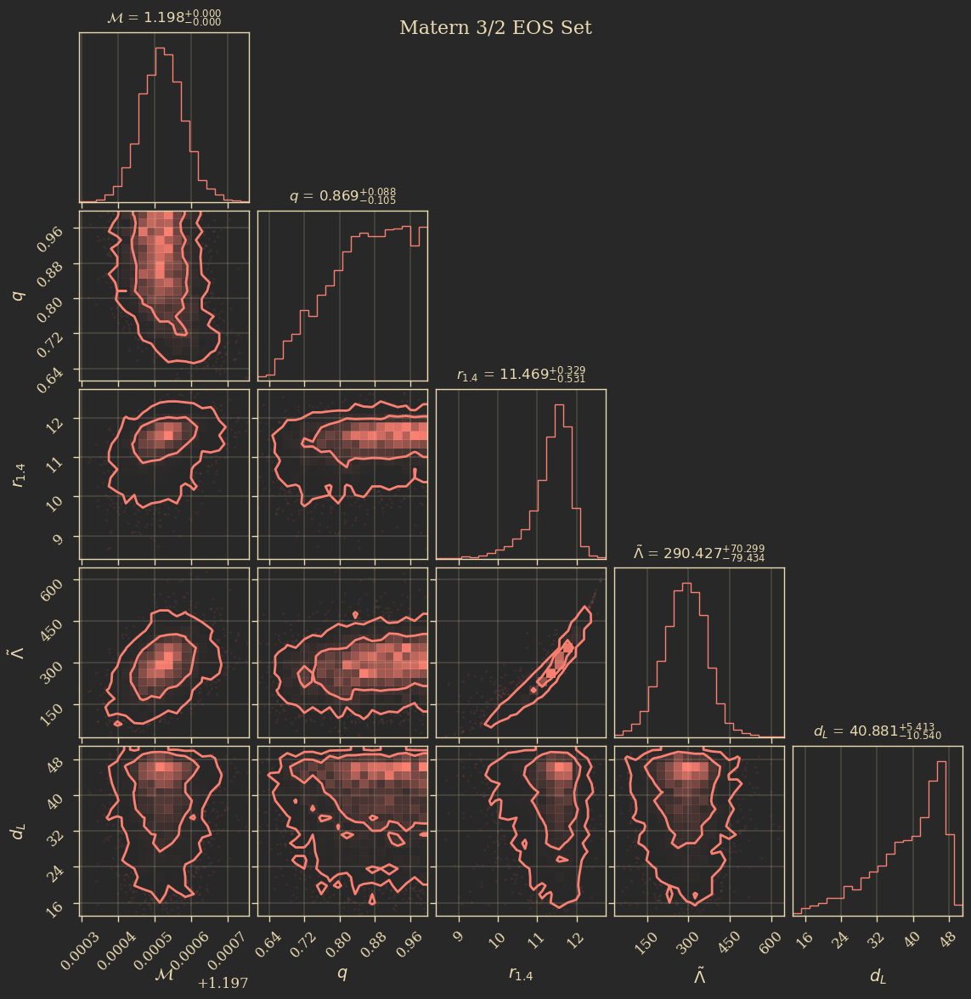

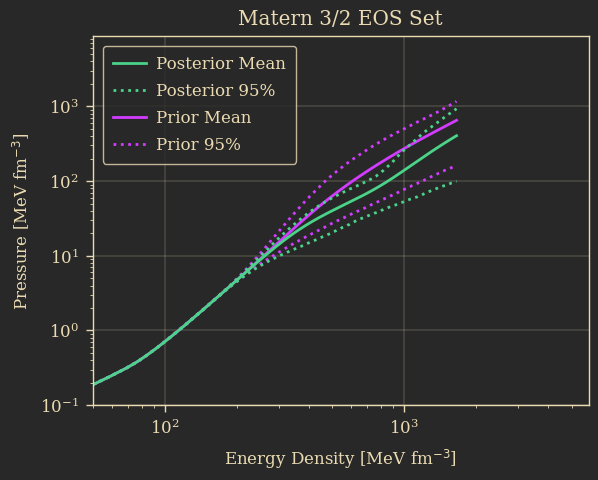

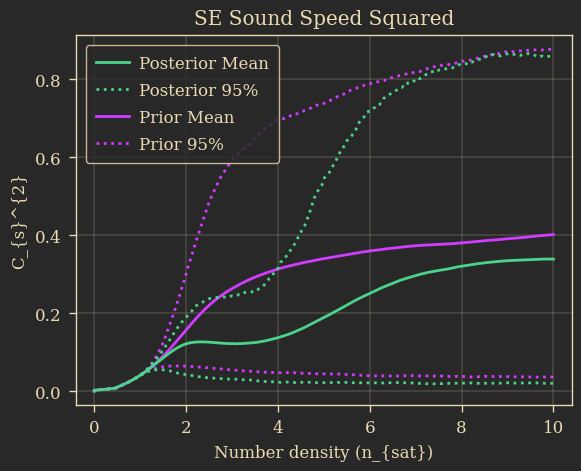

In [7]:
df_m32 = pa.load_results('M32_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df_m32[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Matern 3/2 EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()

params_to_plot = [
   "chirp_mass", "mass_ratio", "r_1.4", "lam_tilde", "luminosity_distance"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$r_{1.4}$", r"$\tilde{\Lambda}$", r"$d_L$"]

df_m32_clean = df_m32[params_to_plot].dropna()

figure = corner.corner(
    df_m32_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Matern 3/2 EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()

eos_m32, mr_m32 = pa.load_eos_data('M32_10ns_1')

num_eos = len(eos_m32[0])

mean_m32, ge_16, ge_84, ge_025, ge_975 = get_stats(eos_m32[1])

plt.plot(eos_m32[0][0], mean_m32, color="#d13cff", label='GE Mean')

# 95% bands
plt.plot(eos_m32[0][0], ge_025, color="#d13cff", ls=':', label='GE 95%')
plt.plot(eos_m32[0][0], ge_975, color="#d13cff", ls=':')

posterior_pressures_m32 = []

for i in range(num_eos):
    if i in df_m32["EOS"]:
        posterior_pressures_m32.append(eos_m32[1][i])

posterior_pressures_m32 = np.array(posterior_pressures_m32)

# Compute mean and 95% percentiles
mean_post_m32 = np.nanmean(posterior_pressures_m32, axis=0)
p025_post_m32 = np.nanpercentile(posterior_pressures_m32, 2.5, axis=0)
p975_post_m32 = np.nanpercentile(posterior_pressures_m32, 97.5, axis=0)

# Plot mean and 95% band
plt.plot(eos_m32[0][0], mean_post_m32, color='#4ad389', label='GE Mean')
plt.plot(eos_m32[0][0], p025_post_m32, color='#4ad389', ls=':', label='GE 95%')
plt.plot(eos_m32[0][0], p975_post_m32, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color="#4ad389", label='Posterior Mean'),
    Line2D([0], [0], color="#4ad389", ls=':', label='Posterior 95%'),
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Matern 3/2 EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_m32, cs2_16_m32, cs2_84_m32, cs2_025_m32, cs2_975_m32 = get_stats(eos_m32[2])
plt.plot(n, mean_cs2_m32, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_m32, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_m32, color="#d13cff", ls=':')

# Posterior samples
posterior_cs2_m32 = []
for i in range(num_eos):
    if i in df_m32["EOS"]:
        posterior_cs2_m32.append(eos_m32[2][i])
posterior_cs2_m32 = np.array(posterior_cs2_m32)

# Posterior mean and 95% bands
mean_post_cs2_m32 = np.nanmean(posterior_cs2_m32, axis=0)
p025_post_cs2_m32 = np.nanpercentile(posterior_cs2_m32, 2.5, axis=0)
p975_post_cs2_m32 = np.nanpercentile(posterior_cs2_m32, 97.5, axis=0)

plt.plot(n, mean_post_cs2_m32, color='#4ad389', label='Posterior Mean')
plt.plot(n, p025_post_cs2_m32, color='#4ad389', ls=':', label='Posterior 95%')
plt.plot(n, p975_post_cs2_m32, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color='#4ad389', label='Posterior Mean'),
    Line2D([0], [0], color='#4ad389', ls=':', label='Posterior 95%'),
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

# M52

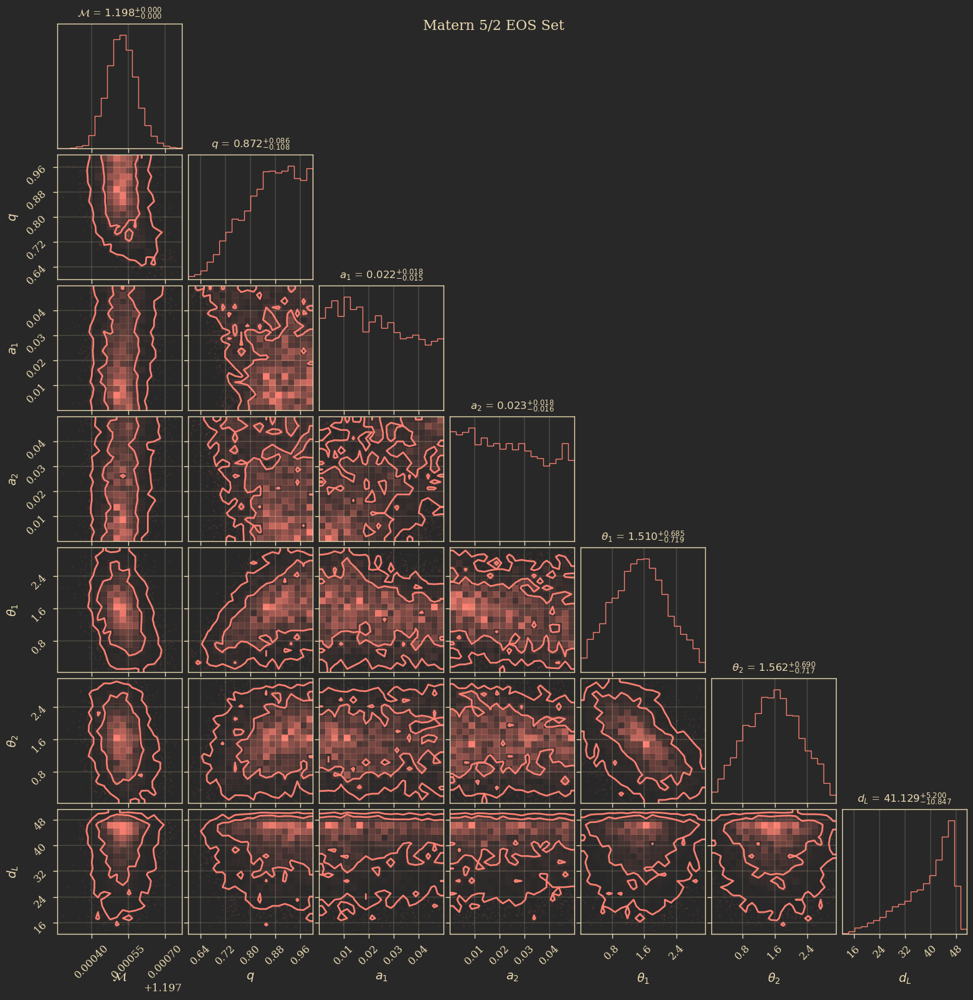

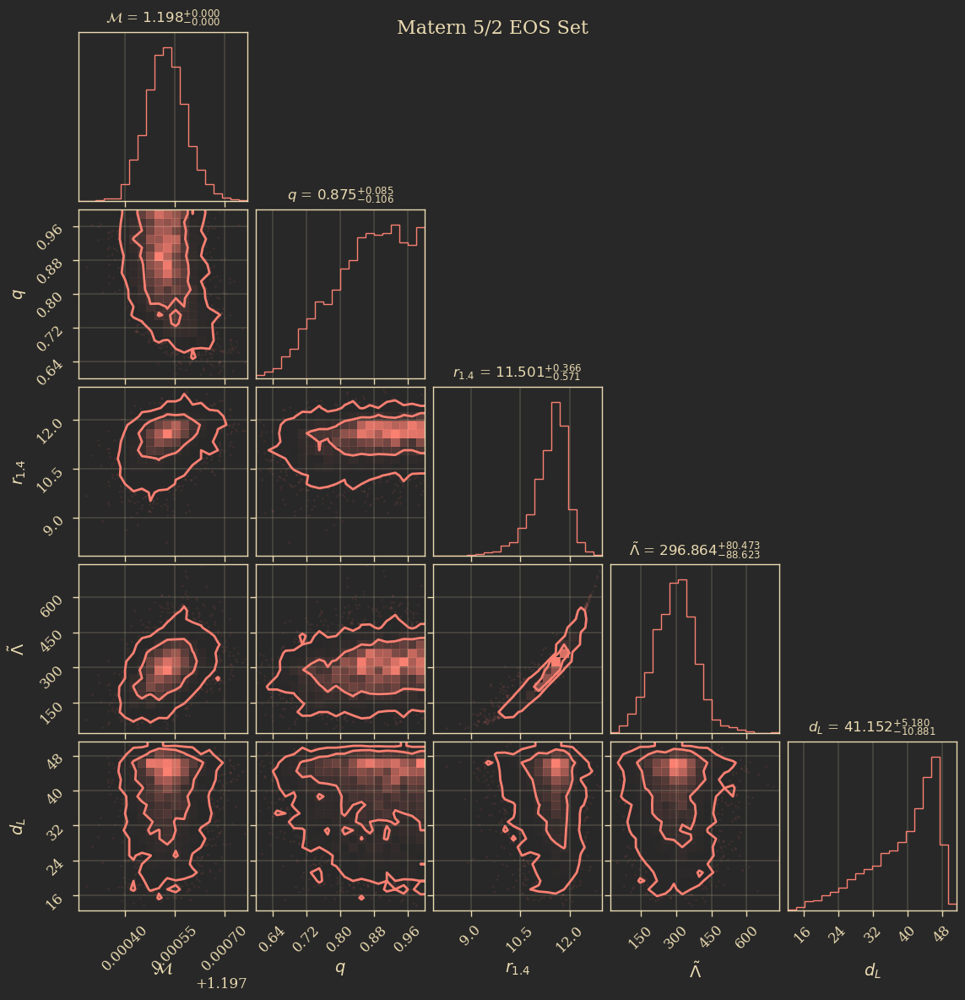

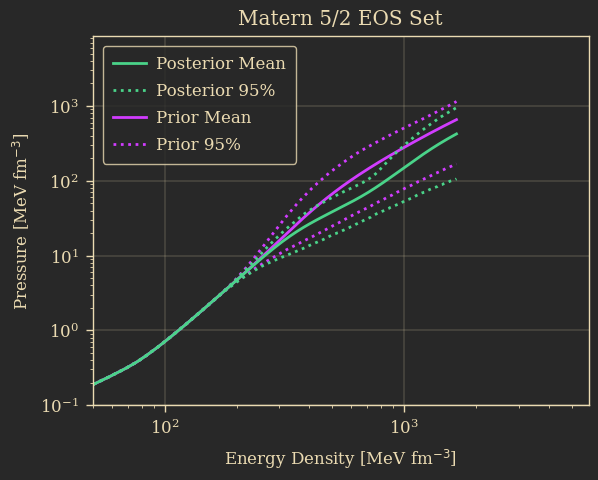

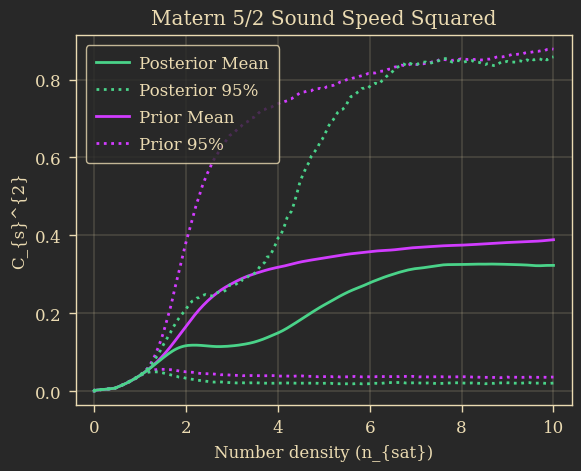

In [94]:
df_m52 = pa.load_results('M52_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]
theme.apply()
figure = corner.corner(
    df_m52[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Matern 5/2 EOS Set", fontsize=16)
plt.show()

params_to_plot = [
   "chirp_mass", "mass_ratio", "r_1.4", "lam_tilde", "luminosity_distance"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$r_{1.4}$", r"$\tilde{\Lambda}$", r"$d_L$"]

df_m52_clean = df_m52[params_to_plot].dropna()

figure = corner.corner(
    df_m52_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    levels=[0.68, 0.95],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14},
    figsize=(8, 8)  # <-- make figure bigger
)
plt.suptitle("Matern 5/2 EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()

eos_m52, mr_m52 = pa.load_eos_data('M52_10ns_1')

theme.apply()

num_eos = len(eos_m52[0])

mean_m52, m52_16, m52_84, m52_025, m52_975 = get_stats(eos_m52[1])

plt.plot(eos_m52[0][0], mean_m52, color="#d13cff", label='M52 Mean')

# 95% bands
plt.plot(eos_m52[0][0], m52_025, color="#d13cff", ls=':', label='M52 95%')
plt.plot(eos_m52[0][0], m52_975, color="#d13cff", ls=':')

posterior_pressures_m52 = []

for i in range(num_eos):
    if i in df_m52["EOS"]:
        posterior_pressures_m52.append(eos_m52[1][i])

posterior_pressures_m52 = np.array(posterior_pressures_m52)

# Compute mean and 95% percentiles
mean_post_m52 = np.nanmean(posterior_pressures_m52, axis=0)
p025_post_m52 = np.nanpercentile(posterior_pressures_m52, 2.5, axis=0)
p975_post_m52 = np.nanpercentile(posterior_pressures_m52, 97.5, axis=0)

# Plot mean and 95% band
plt.plot(eos_m52[0][0], mean_post_m52, color='#4ad389', label='M52 Mean')
plt.plot(eos_m52[0][0], p025_post_m52, color='#4ad389', ls=':', label='M52 95%')
plt.plot(eos_m52[0][0], p975_post_m52, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color="#4ad389", label='Posterior Mean'),
    Line2D([0], [0], color="#4ad389", ls=':', label='Posterior 95%'),
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Matern 5/2 EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_m52, cs2_16_m52, cs2_84_m52, cs2_025_m52, cs2_975_m52 = get_stats(eos_m52[2])
plt.plot(n, mean_cs2_m52, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_m52, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_m52, color="#d13cff", ls=':')

# Posterior samples
posterior_cs2_m52 = []
for i in range(num_eos):
    if i in df_m52["EOS"]:
        posterior_cs2_m52.append(eos_m52[2][i])
posterior_cs2_m52 = np.array(posterior_cs2_m52)

# Posterior mean and 95% bands
mean_post_cs2_m52 = np.nanmean(posterior_cs2_m52, axis=0)
p025_post_cs2_m52 = np.nanpercentile(posterior_cs2_m52, 2.5, axis=0)
p975_post_cs2_m52 = np.nanpercentile(posterior_cs2_m52, 97.5, axis=0)

plt.plot(n, mean_post_cs2_m52, color='#4ad389', label='Posterior Mean')
plt.plot(n, p025_post_cs2_m52, color='#4ad389', ls=':', label='Posterior 95%')
plt.plot(n, p975_post_cs2_m52, color='#4ad389', ls=':')

legend_handles = [
    Line2D([0], [0], color='#4ad389', label='Posterior Mean'),
    Line2D([0], [0], color='#4ad389', ls=':', label='Posterior 95%'),
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"Matern 5/2 Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

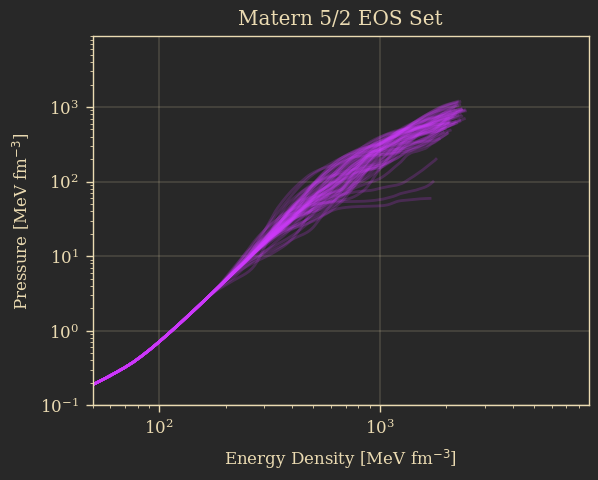

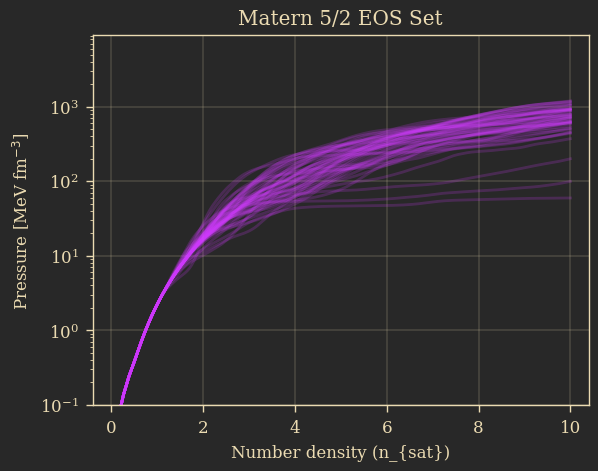

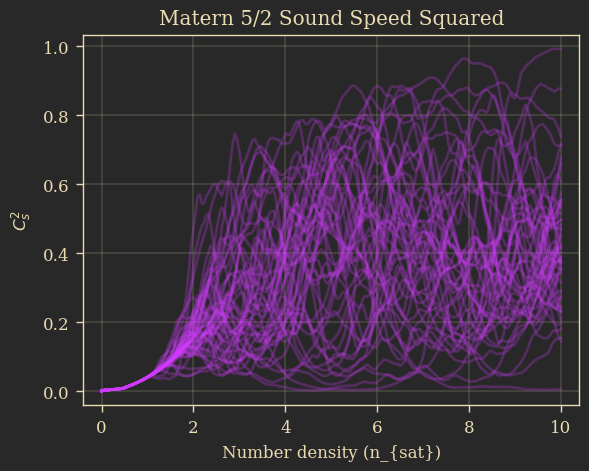

In [116]:
idx_rand_m52 = np.random.choice(np.arange(len(eos_m52[0])), size=50, replace=False)

for i in range(50):
    plt.plot(eos_m52[0][idx_rand_m52[i]], eos_m52[1][idx_rand_m52[i]], color='#d13cff', alpha=0.2)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Matern 5/2 EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_m52[1][idx_rand_m52[i]], color='#d13cff', alpha=0.2)
plt.yscale("log")
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Matern 5/2 EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()


for i in range(50):
    plt.plot(n, eos_m52[2][idx_rand_m52[i]], color="#d13cff", alpha=0.25)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Matern 5/2 Sound Speed Squared")
plt.show()

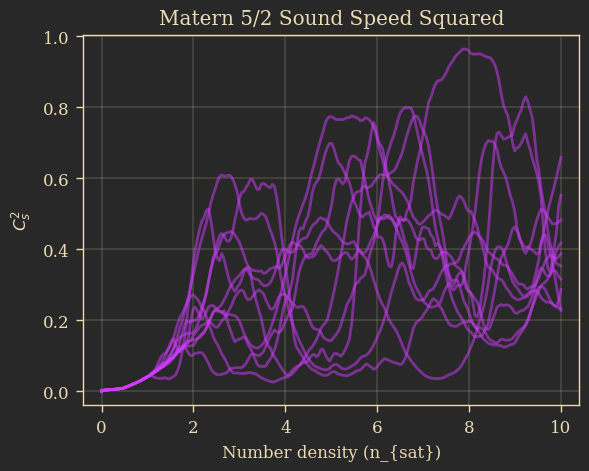

In [132]:
for i in range(10):
    plt.plot(n, eos_m52[2][idx_rand_m52[i]], color="#d13cff", alpha=0.5)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Matern 5/2 Sound Speed Squared")
plt.show()

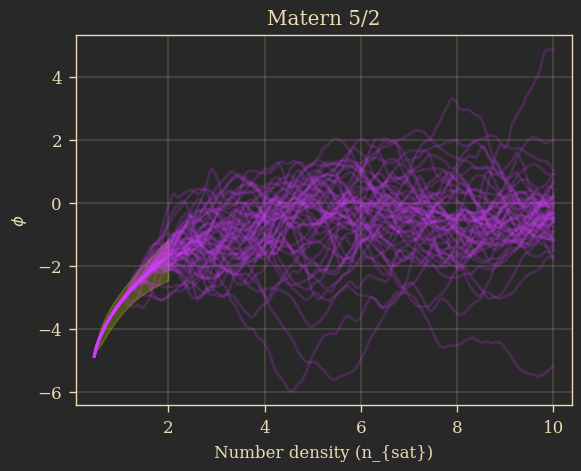

In [171]:
for i in range(50):
    plt.plot(n[75:], pc.get_phi(eos_m52[2][idx_rand_m52[i]][75:]), color="#d13cff", alpha=0.2)
plt.fill_between(n_ceft, pc.get_phi(cs2_l), pc.get_phi(cs2_u), color="yellow", alpha=0.2)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$\phi$")
plt.title(r"Matern 5/2")
plt.show()

# SE 0.25 - 0.75 lengthscale

In [9]:
eos_se2, mr_se2 = pa.load_eos_data('SE_10ns_2')

MRL file not found: /home/sam/thesis/code/results/tov_res/SE_10ns_2_tidal.npy


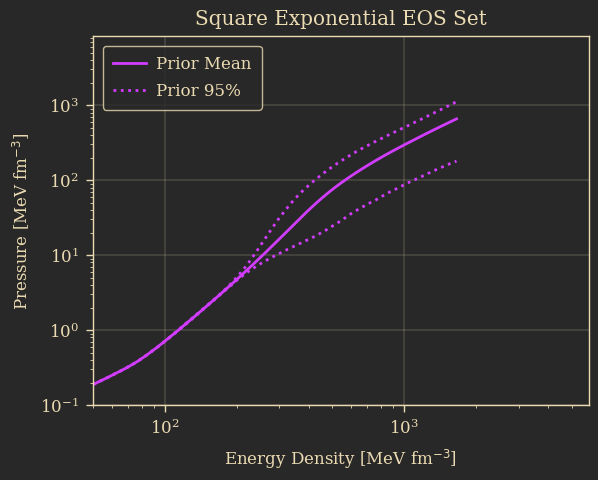

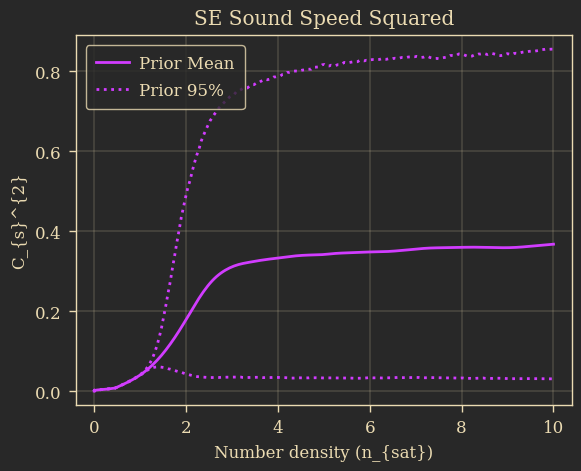

In [10]:
num_eos = len(eos_se2[0])

mean_se2, se2_16, se2_84, se2_025, se2_975 = get_stats(eos_se2[1])

plt.plot(eos_se2[0][0], mean_se2, color="#d13cff", label='SE Mean')


# 95% bands
plt.plot(eos_se2[0][0], se2_025, color="#d13cff", ls=':', label='SE 95%')
plt.plot(eos_se2[0][0], se2_975, color="#d13cff", ls=':')




legend_handles = [
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_se2, cs2_16_se2, cs2_84_se2, cs2_025_se2, cs2_975_se2 = get_stats(eos_se2[2])
plt.plot(n, mean_cs2_se2, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_se2, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_se2, color="#d13cff", ls=':')


legend_handles = [
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

# SE 1.5 - 2 lengthscale

MRL file not found: /home/sam/thesis/code/results/tov_res/SE_10ns_3_tidal.npy


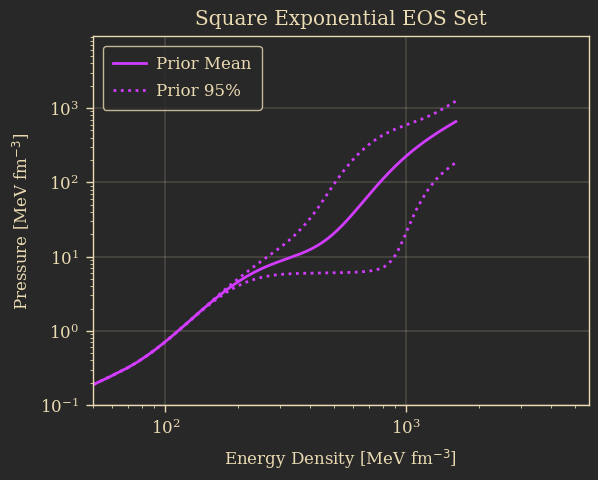

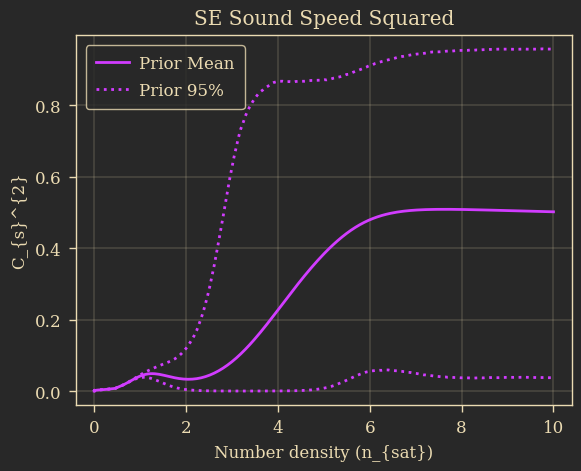

In [11]:
eos_se3, mr_se3 = pa.load_eos_data('SE_10ns_3')

num_eos = len(eos_se3[0])

mean_se3, se3_16, se3_84, se3_025, se3_975 = get_stats(eos_se3[1])

plt.plot(eos_se3[0][0], mean_se3, color="#d13cff", label='SE Mean')


# 95% bands
plt.plot(eos_se3[0][0], se3_025, color="#d13cff", ls=':', label='SE 95%')
plt.plot(eos_se3[0][0], se3_975, color="#d13cff", ls=':')




legend_handles = [
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_se3, cs2_16_se3, cs2_84_se3, cs2_025_se3, cs2_975_se3 = get_stats(eos_se3[2])
plt.plot(n, mean_cs2_se3, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_se3, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_se3, color="#d13cff", ls=':')


legend_handles = [
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

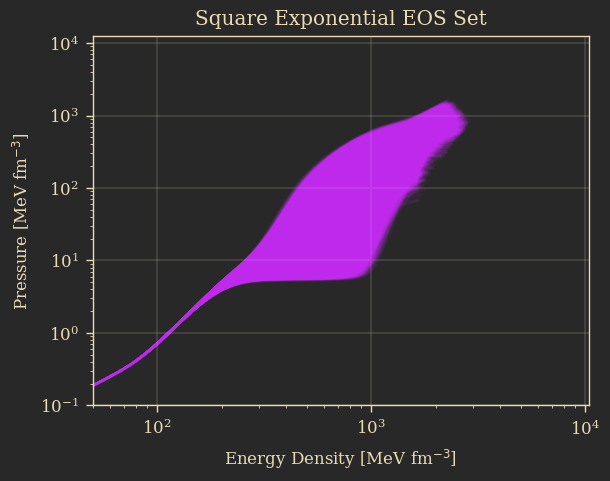

In [42]:
for i in range(20000):
    plt.plot(eos_se3[0][i], eos_se3[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

In [61]:
sample_idx_dip = np.where((300 < eos_se3[0][1]) & (eos_se3[0][1] < 1000))[0]

In [ ]:
eos_se3[0][1][sample_idx_dip]

array([300.89951136, 308.48925363, 316.08078293, 323.6738689 ,
       331.26830449, 338.8639233 , 346.4605763 , 354.05814447,
       361.65652151, 369.2556229 , 376.85537333, 384.45571327,
       392.05658982, 399.65796159, 407.25979206, 414.86205323,
       422.46472078, 430.06777692, 437.67120678, 445.27500076,
       452.87915172, 460.48365712, 468.08851659, 475.6937342 ,
       483.29931616, 490.90527324, 498.51161856, 506.1183703 ,
       513.72554939, 521.33318275, 528.94130059, 536.5499405 ,
       544.15914416, 551.76896248, 559.37945154, 566.99067903,
       574.60271914, 582.21566064, 589.82960039, 597.4446533 ,
       605.06094418, 612.67861967, 620.29783828, 627.91878409,
       635.54165493, 643.16667744, 650.7940934 , 658.42417546,
       666.05721202, 673.69352226, 681.33344048, 688.97732883,
       696.62556231, 704.27853743, 711.93665942, 719.60034518,
       727.27001452, 734.94608604, 742.62897418, 750.3190774 ,
       758.01678234, 765.72244461, 773.43640058, 781.15

In [63]:
eos_se3[1][1][sample_idx_dip]<mean_se3[sample_idx_dip]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [74]:
len(np.where((eos_se3[1][1][sample_idx_dip]<mean_se3[sample_idx_dip]) == True)[0])

91

In [73]:
len(np.where((eos_se3[1][1][sample_idx_dip]<mean_se3[sample_idx_dip]) == True)[0]) > len(eos_se3[1][1][sample_idx_dip])/2

True

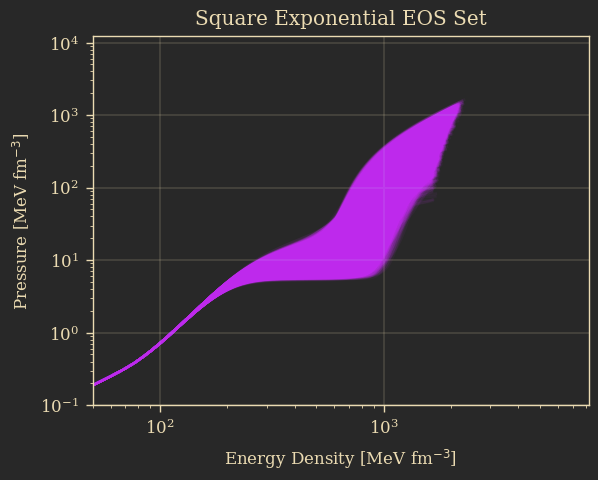

In [89]:
idx = []
for i in range(20000):
    sample_idx_dip = np.where((300 < eos_se3[0][i]) & (eos_se3[0][i] < 1000))[0]
    if len(np.where((eos_se3[1][i][sample_idx_dip]<mean_se3[sample_idx_dip]) == True)[0]) > len(eos_se3[1][i][sample_idx_dip])/2:
        plt.plot(eos_se3[0][i], eos_se3[1][i], color="#d13cff", alpha=0.05)
        idx.append(i)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

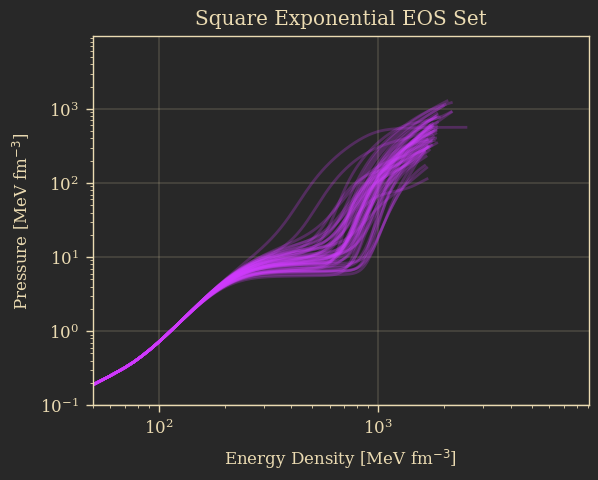

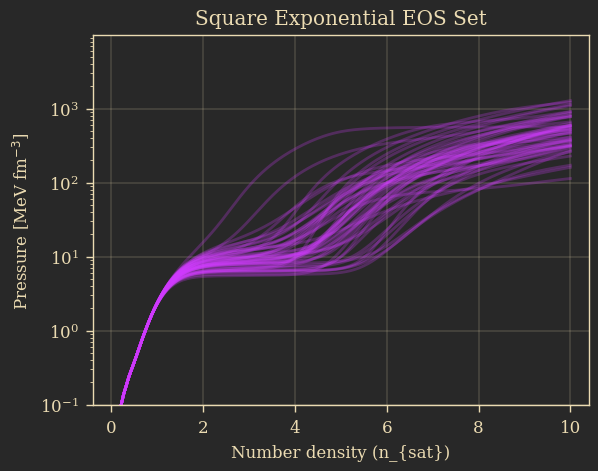

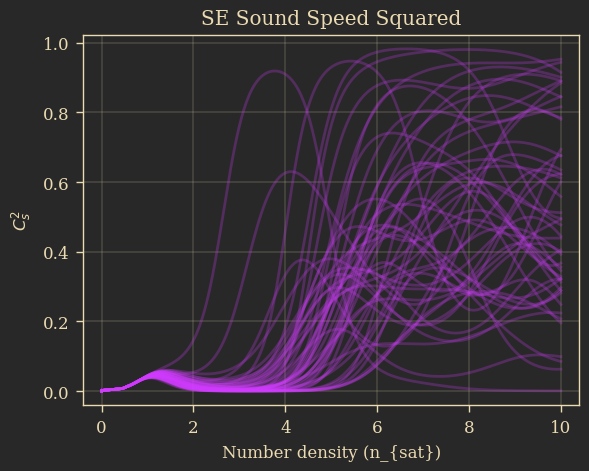

In [115]:
rands = np.random.choice(idx, 50)

for i in range(50):
    plt.plot(eos_se3[0][rands[i]], eos_se3[1][rands[i]], color="#d13cff", alpha=0.25)
    
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_se3[1][rands[i]], color="#d13cff", alpha=0.25)
    
plt.yscale("log")
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_se3[2][rands[i]], color="#d13cff", alpha=0.25)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"SE Sound Speed Squared")
plt.show()

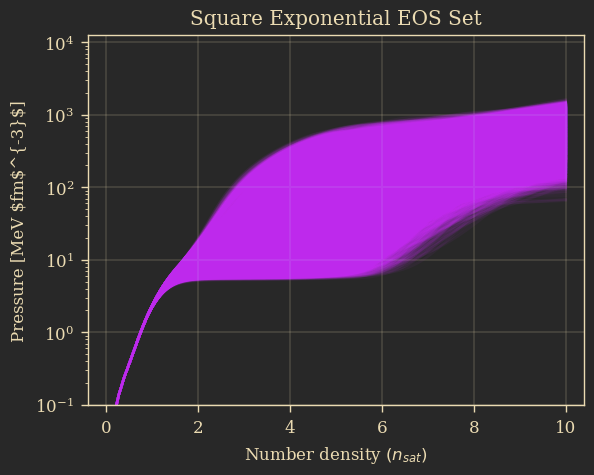

In [109]:
for i in range(20000):
    plt.plot(n, eos_se3[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xlabel(r"Number density $(n_{sat})$")
plt.ylabel(r"Pressure [MeV $fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

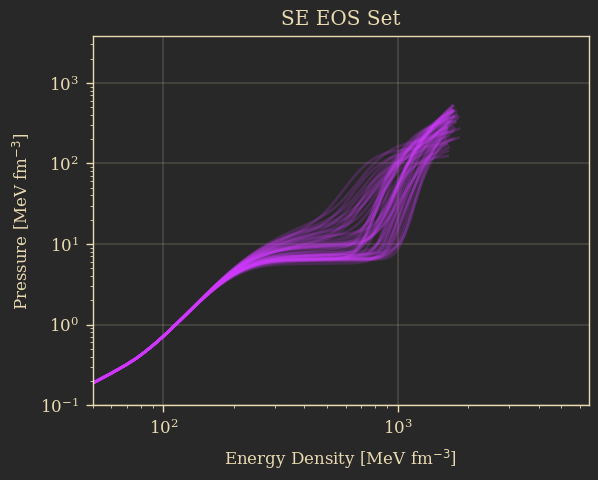

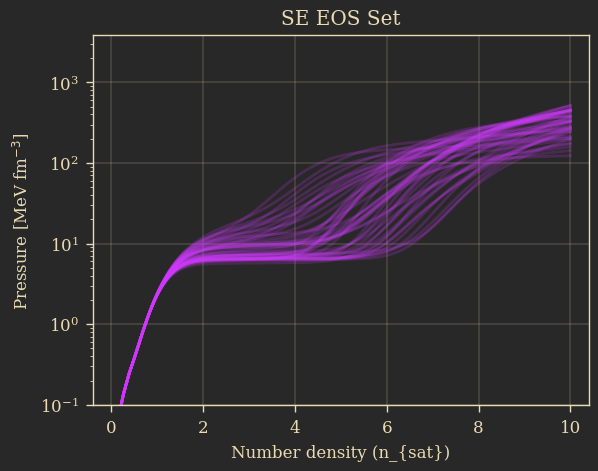

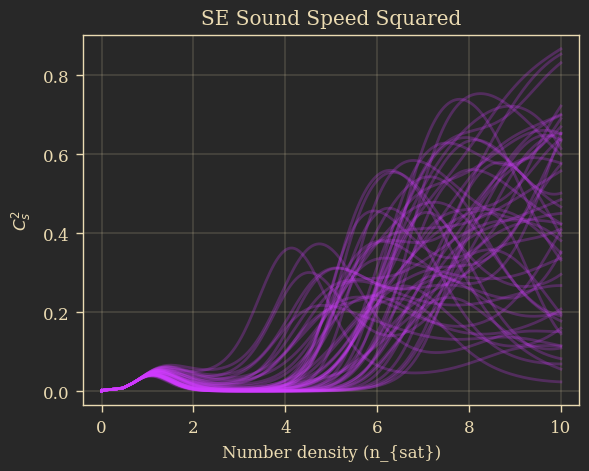

In [114]:
idx_rand_se3_5000 = np.random.choice(np.arange(5000), size=50, replace=False)

for i in range(50):
    plt.plot(eos_se3[0][idx_rand_se3_5000[i]], eos_se3[1][idx_rand_se3_5000[i]], color='#d13cff', alpha=0.2)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"SE EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(50):
    plt.plot(n, eos_se3[1][idx_rand_se3_5000[i]], color='#d13cff', alpha=0.2)
plt.yscale("log")
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"SE EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()


for i in range(50):
    plt.plot(n, eos_se3[2][idx_rand_se3_5000[i]], color="#d13cff", alpha=0.25)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"SE Sound Speed Squared")
plt.show()

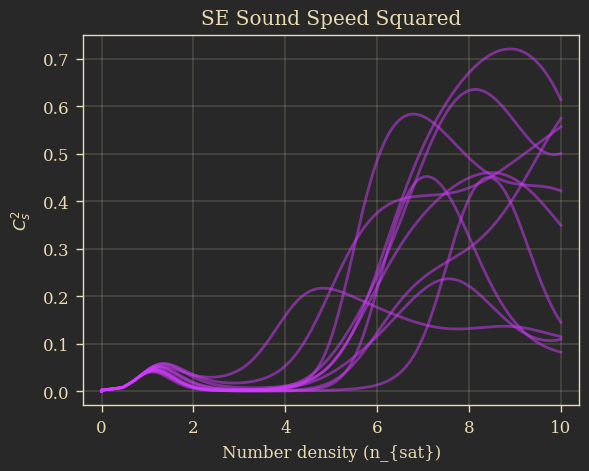

In [133]:
for i in range(10):
    plt.plot(n, eos_se3[2][idx_rand_se3_5000[i]], color="#d13cff", alpha=0.5)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"SE Sound Speed Squared")
plt.show()

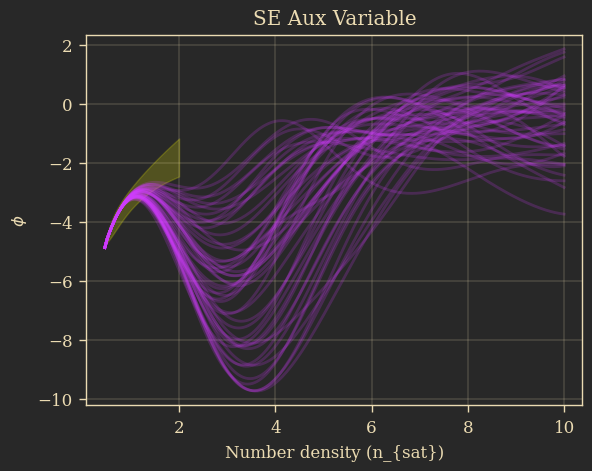

In [174]:
for i in range(50):
    plt.plot(n[75:], pc.get_phi(eos_se3[2][idx_rand_se3_5000[i]][75:]), color="#d13cff", alpha=0.2)
plt.fill_between(n_ceft, pc.get_phi(cs2_l), pc.get_phi(cs2_u), color="yellow", alpha=0.2)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$\phi$")
plt.title(r"SE Aux Variable")
plt.show()

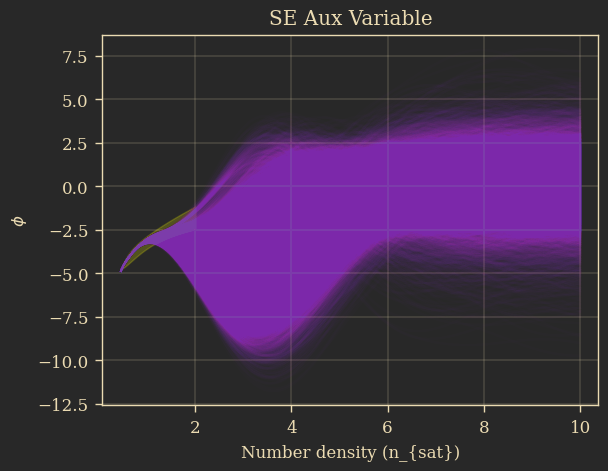

In [184]:
for i in range(20000):
    plt.plot(n[75:], pc.get_phi(eos_se3[2][i][75:]), color="#d13cff", alpha=0.01)
plt.fill_between(n_ceft, pc.get_phi(cs2_l), pc.get_phi(cs2_u), color="yellow", alpha=0.2)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$\phi$")
plt.title(r"SE Aux Variable")
plt.show()

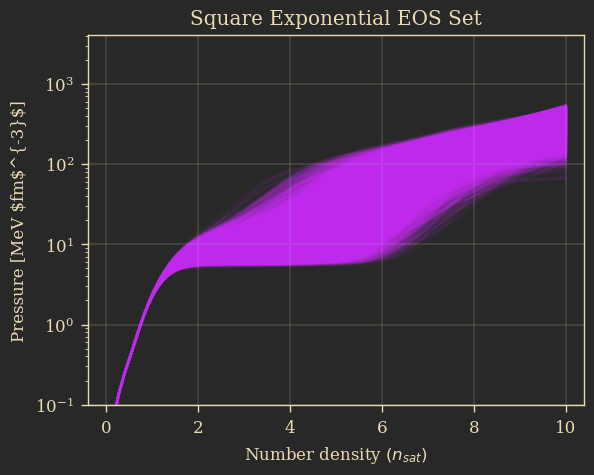

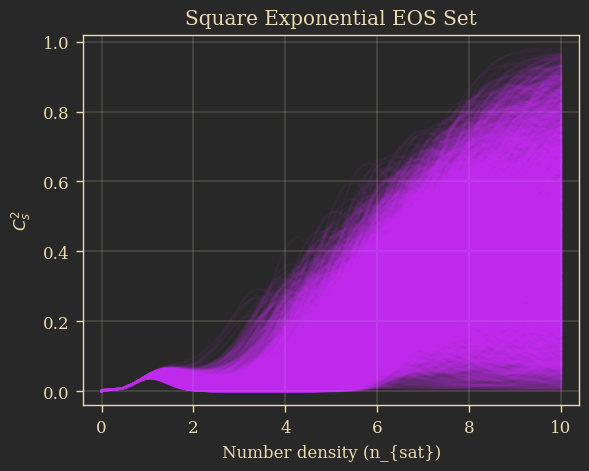

In [ ]:
for i in range(5000):
    plt.plot(n, eos_se3[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xlabel(r"Number density $(n_{sat})$")
plt.ylabel(r"Pressure [MeV $fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(5000):
    plt.plot(n, eos_se3[2][i], color='#d13cff', alpha=0.05)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Square Exponential EOS Set")
theme.apply_transforms()
plt.show()

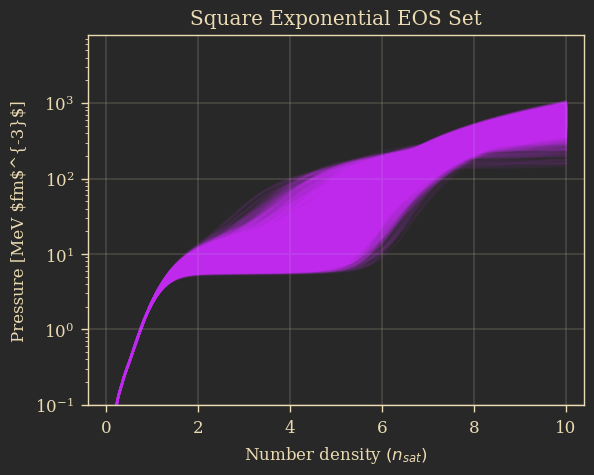

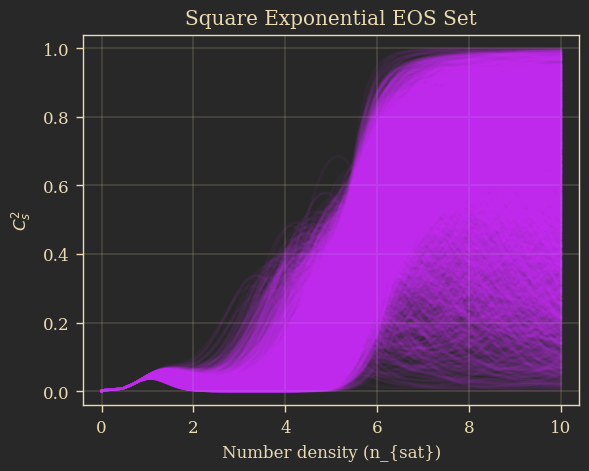

In [111]:
for i in range(5000,10000):
    plt.plot(n, eos_se3[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xlabel(r"Number density $(n_{sat})$")
plt.ylabel(r"Pressure [MeV $fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(5000,10000):
    plt.plot(n, eos_se3[2][i], color='#d13cff', alpha=0.05)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Square Exponential EOS Set")
theme.apply_transforms()
plt.show()

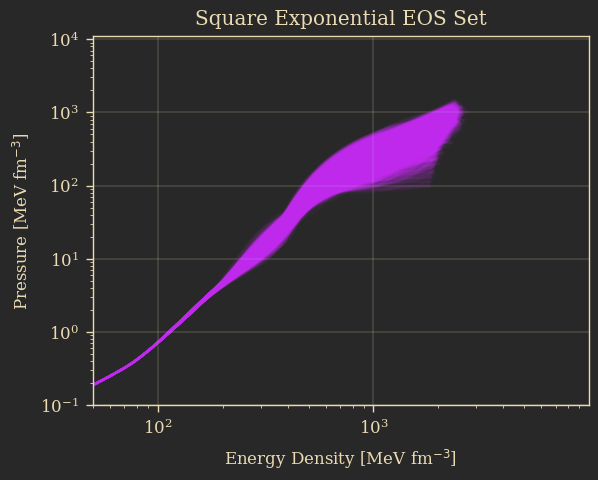

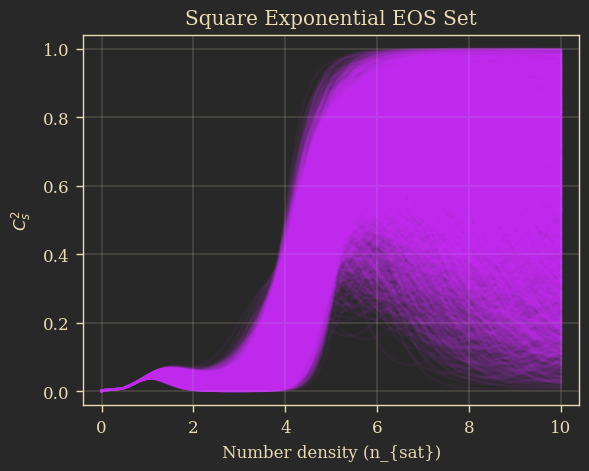

In [112]:
for i in range(10000,15000):
    plt.plot(eos_se[0][i], eos_se[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(10000, 15000):
    plt.plot(n, eos_se3[2][i], color='#d13cff', alpha=0.05)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Square Exponential EOS Set")
theme.apply_transforms()
plt.show()

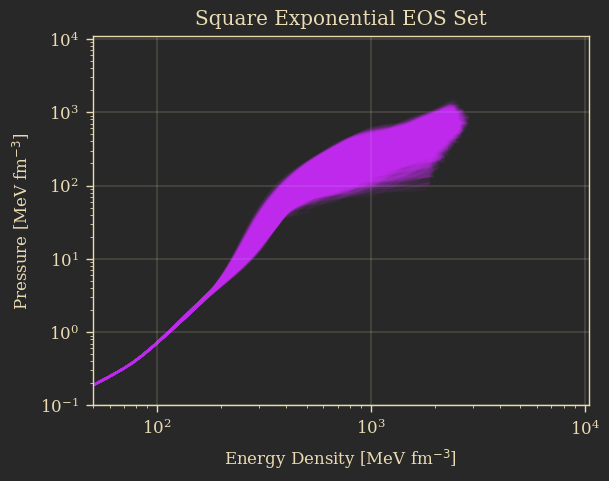

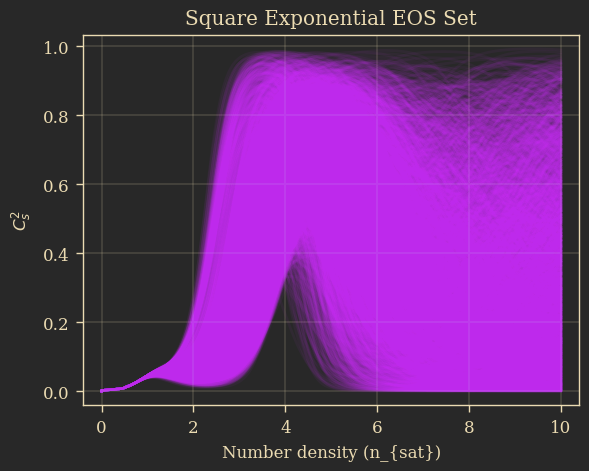

In [113]:
for i in range(15000, 20000):
    plt.plot(eos_se[0][i], eos_se[1][i], color='#d13cff', alpha=0.05)
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

for i in range(15000, 20000):
    plt.plot(n, eos_se3[2][i], color='#d13cff', alpha=0.05)
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.title(r"Square Exponential EOS Set")
theme.apply_transforms()
plt.show()

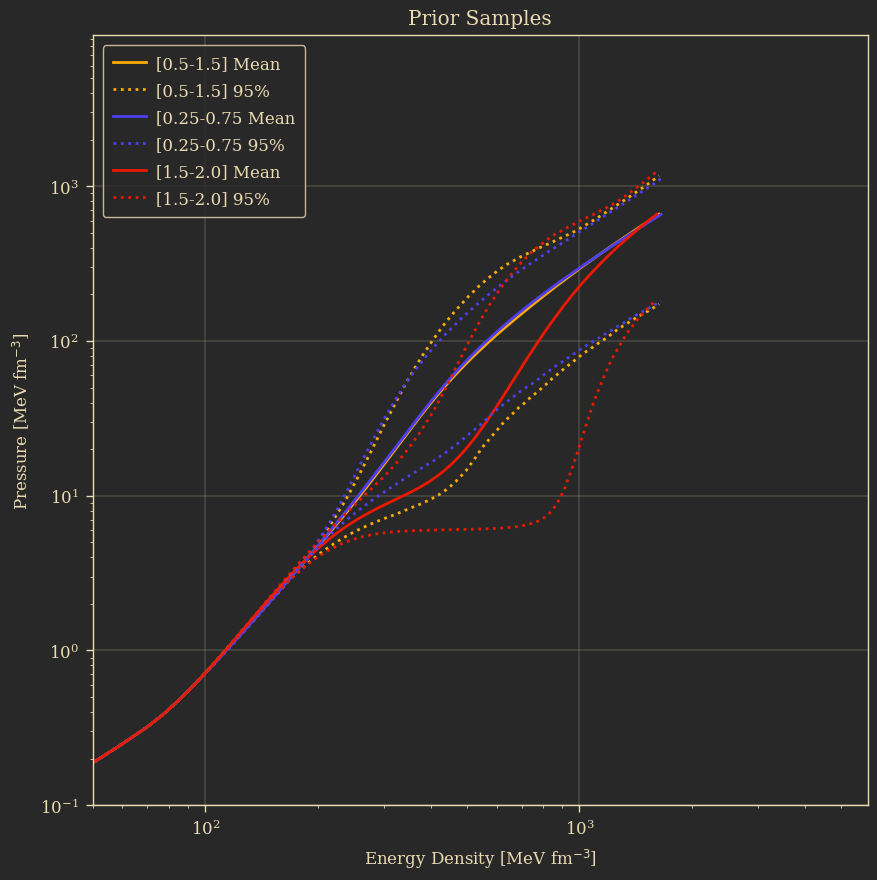

In [12]:
def get_stats(arr):
    mean = np.nanmean(arr, axis=0)
    p16 = np.nanpercentile(arr, 16, axis=0)
    p84 = np.nanpercentile(arr, 84, axis=0)
    p025 = np.nanpercentile(arr, 2.5, axis=0)
    p975 = np.nanpercentile(arr, 97.5, axis=0)
    return mean, p16, p84, p025, p975

plt.figure(figsize=(10, 10))  

plt.plot(eos_se[0][0], mean_se, color="#ffac00", label='[0.5-1.5] Mean')
plt.plot(eos_se2[0][0], mean_se2, color="#4e3fee", label='[0.25-0.75] Mean')
plt.plot(eos_se3[0][0], mean_se3, color="#ea1900", label='[1.5-2.0] Mean')


# 95% bands
plt.plot(eos_se[0][0], se_025, color="#ffac00", ls=':', label='[0.5-1.5] 95%')
plt.plot(eos_se[0][0], se_975, color="#ffac00", ls=':')
plt.plot(eos_se2[0][0], se2_025, color="#4e3fee", ls=':', label='[0.25-0.75 95%')
plt.plot(eos_se2[0][0], se2_975, color="#4e3fee", ls=':')
plt.plot(eos_se3[0][0], se3_025, color="#ea1900", ls=':', label='[1.5-2.0] 95%')
plt.plot(eos_se3[0][0], se3_975, color="#ea1900", ls=':')


legend_handles = [
    Line2D([0], [0], color="#ffac00", label='[0.5-1.5] Mean'),
    Line2D([0], [0], color="#ffac00", ls=':', label='[0.5-1.5] 95%'),
    Line2D([0], [0], color="#4e3fee", label='[0.25-0.75 Mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='[0.25-0.75 95%'),
    Line2D([0], [0], color="#ea1900", label='[1.5-2.0] Mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='[1.5-2.0] 95%'),
]

plt.title("Prior Samples")
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.xlim(50,)
plt.ylim(1e-1,)
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

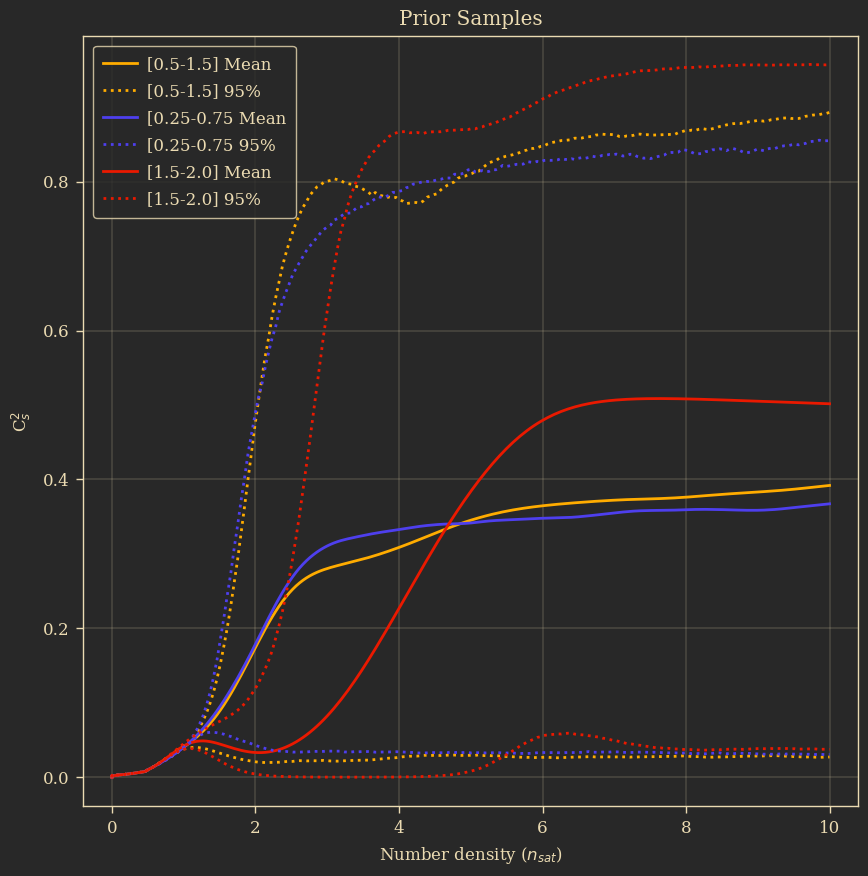

In [13]:
def get_stats(arr):
    mean = np.nanmean(arr, axis=0)
    p16 = np.nanpercentile(arr, 16, axis=0)
    p84 = np.nanpercentile(arr, 84, axis=0)
    p025 = np.nanpercentile(arr, 2.5, axis=0)
    p975 = np.nanpercentile(arr, 97.5, axis=0)
    return mean, p16, p84, p025, p975

n = anal.get_n_test(10, 200)

plt.figure(figsize=(10, 10))  
plt.plot(n, mean_cs2_se, color="#ffac00", label='[0.5-1.5] Mean')
plt.plot(n, mean_cs2_se2, color="#4e3fee", label='[0.25-0.75] Mean')
plt.plot(n, mean_cs2_se3, color="#ea1900", label='[1.5-2.0] Mean')


# 95% bands
plt.plot(n, cs2_025_se, color="#ffac00", ls=':', label='[0.5-1.5] 95%')
plt.plot(n, cs2_975_se, color="#ffac00", ls=':')
plt.plot(n, cs2_025_se2, color="#4e3fee", ls=':', label='[0.25-0.75 95%')
plt.plot(n, cs2_975_se2, color="#4e3fee", ls=':')
plt.plot(n, cs2_025_se3, color="#ea1900", ls=':', label='[1.5-2.0] 95%')
plt.plot(n, cs2_975_se3, color="#ea1900", ls=':')


legend_handles = [
    Line2D([0], [0], color="#ffac00", label='[0.5-1.5] Mean'),
    Line2D([0], [0], color="#ffac00", ls=':', label='[0.5-1.5] 95%'),
    Line2D([0], [0], color="#4e3fee", label='[0.25-0.75 Mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='[0.25-0.75 95%'),
    Line2D([0], [0], color="#ea1900", label='[1.5-2.0] Mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='[1.5-2.0] 95%'),
]

plt.title("Prior Samples")
plt.xlabel(r"Number density ($n_{sat}$)")
plt.ylabel(r"C$_{s}^{2}$")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()


# M52 1.936 - 2.582 lengthscale

In [4]:
eos_m52_2, mr_m52_2 = pa.load_eos_data('M52_10ns_2')

num_eos = len(eos_m52_2[0])

mean_m52_2, m52_2_16, m52_2_84, m52_2_025, m52_2_975 = get_stats(eos_m52_2[1])

plt.plot(eos_m52_2[0][0], mean_m52_2, color="#d13cff", label='SE Mean')


# 95% bands
plt.plot(eos_m52_2[0][0], m52_2_025, color="#d13cff", ls=':', label='SE 95%')
plt.plot(eos_m52_2[0][0], m52_2_975, color="#d13cff", ls=':')




legend_handles = [
    Line2D([0], [0], color="#d13cff", label='Prior Mean'),
    Line2D([0], [0], color="#d13cff", ls=':', label='Prior 95%')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"Square Exponential EOS Set")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

n = anal.get_n_test(10, 200)

# Plot prior mean and 95% bands for sound speed squared
mean_cs2_m52_2, cs2_16_m52_2, cs2_84_m52_2, cs2_025_m52_2, cs2_975_m52_2 = get_stats(eos_m52_2[2])
plt.plot(n, mean_cs2_m52_2, color="#d13cff", label='SE Mean')
plt.plot(n, cs2_025_m52_2, color="#d13cff", ls=':', label='SE 95%')
plt.plot(n, cs2_975_m52_2, color="#d13cff", ls=':')


legend_handles = [
    Line2D([0], [0], color='#d13cff', label='Prior Mean'),
    Line2D([0], [0], color='#d13cff', ls=':', label='Prior 95%')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE Sound Speed Squared")
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

EoS file not found: /home/sam/thesis/code/results/eos_samples/M52_10ns_2/M52_10ns_2_eos.npy


UnboundLocalError: local variable 'mr' referenced before assignment

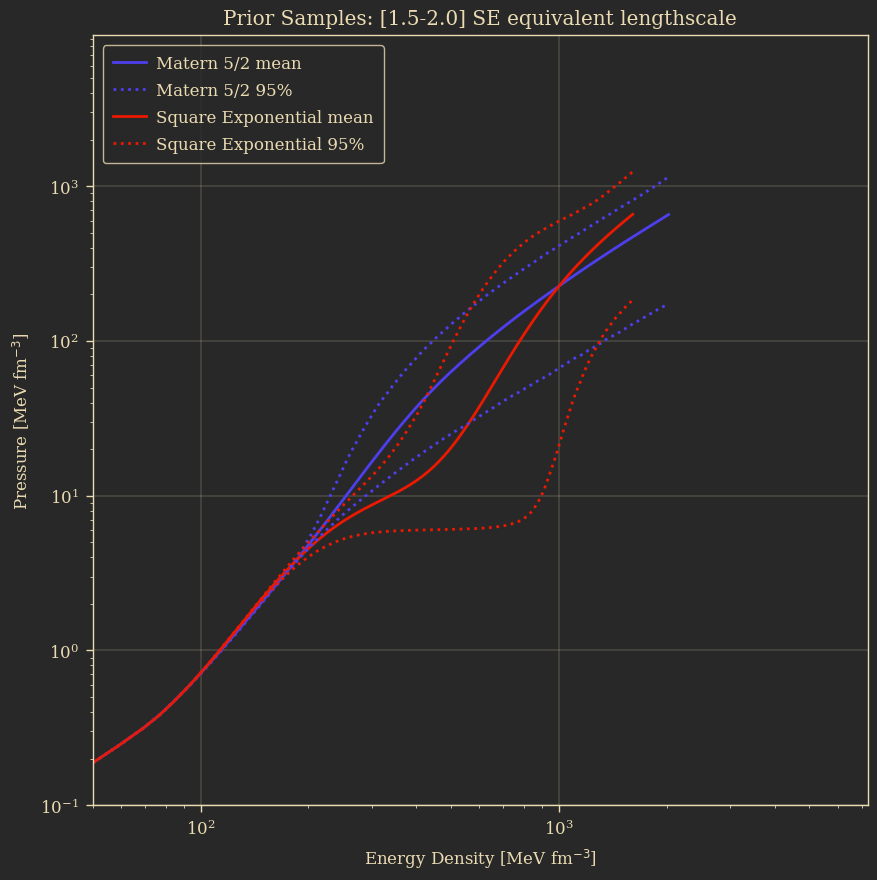

In [9]:
def get_stats(arr):
    mean = np.nanmean(arr, axis=0)
    p16 = np.nanpercentile(arr, 16, axis=0)
    p84 = np.nanpercentile(arr, 84, axis=0)
    p025 = np.nanpercentile(arr, 2.5, axis=0)
    p975 = np.nanpercentile(arr, 97.5, axis=0)
    return mean, p16, p84, p025, p975

plt.figure(figsize=(10, 10))  

plt.plot(eos_m52_2[0][0], mean_m52_2, color="#4e3fee", label='Matern 5/2 mean')
plt.plot(eos_se3[0][0], mean_se3, color="#ea1900", label='Square Exponential mean')


# 95% bands
plt.plot(eos_m52_2[0][0], m52_2_025, color="#4e3fee", ls=':', label='Matern 5/2 95%')
plt.plot(eos_m52_2[0][0], m52_2_975, color="#4e3fee", ls=':')
plt.plot(eos_se3[0][0], se3_025, color="#ea1900", ls=':', label='Square Exponential 95%')
plt.plot(eos_se3[0][0], se3_975, color="#ea1900", ls=':')


legend_handles = [
    Line2D([0], [0], color="#4e3fee", label='Matern 5/2 mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='Matern 5/2 95%'),
    Line2D([0], [0], color="#ea1900", label='Square Exponential mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='Square Exponential 95%'),
]

plt.title("Prior Samples: [1.5-2.0] SE equivalent lengthscale")
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.xlim(50,)
plt.ylim(1e-1,)
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

# comparing

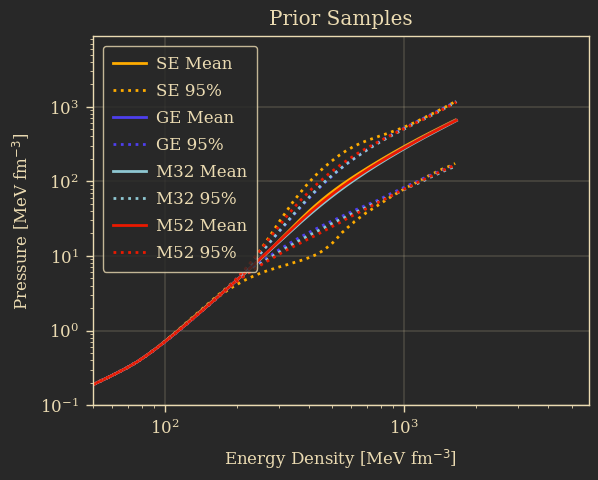

In [14]:
def get_stats(arr):
    mean = np.nanmean(arr, axis=0)
    p16 = np.nanpercentile(arr, 16, axis=0)
    p84 = np.nanpercentile(arr, 84, axis=0)
    p025 = np.nanpercentile(arr, 2.5, axis=0)
    p975 = np.nanpercentile(arr, 97.5, axis=0)
    return mean, p16, p84, p025, p975

mean_se, se_16, se_84, se_025, se_975 = get_stats(eos_se[1])
mean_ge, ge_16, ge_84, ge_025, ge_975 = get_stats(eos_ge[1])
mean_m32, m32_16, m32_84, m32_025, m32_975 = get_stats(eos_m32[1])
mean_m52, m52_16, m52_84, m52_025, m52_975 = get_stats(eos_m52[1])

plt.plot(eos_se[0][0], mean_se, color="#ffac00", label='SE Mean')
plt.plot(eos_ge[0][0], mean_ge, color="#4e3fee", label='GE Mean')
plt.plot(eos_m32[0][0], mean_m32, color="#8EC7D2", label='M32 Mean')
plt.plot(eos_m52[0][0], mean_m52, color="#ea1900", label='M52 Mean')


# 95% bands
plt.plot(eos_se[0][0], se_025, color="#ffac00", ls=':', label='SE 95%')
plt.plot(eos_se[0][0], se_975, color="#ffac00", ls=':')
plt.plot(eos_ge[0][0], ge_025, color="#4e3fee", ls=':', label='GE 95%')
plt.plot(eos_ge[0][0], ge_975, color="#4e3fee", ls=':')
plt.plot(eos_m32[0][0], m32_025, color="#8EC7D2", ls=':', label='M32 95%')
plt.plot(eos_m32[0][0], m32_975, color="#8EC7D2", ls=':')
plt.plot(eos_m52[0][0], m52_025, color="#ea1900", ls=':', label='M52 95%')
plt.plot(eos_m52[0][0], m52_975, color="#ea1900", ls=':')

legend_handles = [
    Line2D([0], [0], color="#ffac00", label='SE Mean'),
    Line2D([0], [0], color="#ffac00", ls=':', label='SE 95%'),
    Line2D([0], [0], color="#4e3fee", label='GE Mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='GE 95%'),
    Line2D([0], [0], color="#8EC7D2", label='M32 Mean'),
    Line2D([0], [0], color="#8EC7D2", ls=':', label='M32 95%'),
    Line2D([0], [0], color="#ea1900", label='M52 Mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='M52 95%'),
]

plt.title("Prior Samples")
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.xlim(50,)
plt.ylim(1e-1,)
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

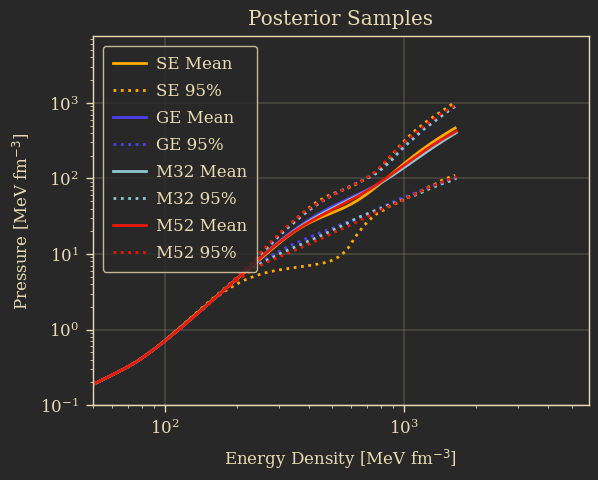

In [15]:
posterior_pressures_se = []
posterior_pressures_ge = []
posterior_pressures_m52 = []

for i in range(num_eos):
    if i in df_se["EOS"]:
        posterior_pressures_se.append(eos_se[1][i])
    if i in df_ge["EOS"]:
        posterior_pressures_ge.append(eos_ge[1][i])
    if i in df_m52["EOS"]:
        posterior_pressures_m52.append(eos_m52[1][i])
posterior_pressures_se = np.array(posterior_pressures_se)
posterior_pressures_ge = np.array(posterior_pressures_ge)
posterior_pressures_m52 = np.array(posterior_pressures_m52)

# Compute mean and 95% percentiles
mean_post_se = np.nanmean(posterior_pressures_se, axis=0)
mean_post_ge = np.nanmean(posterior_pressures_ge, axis=0)
mean_post_m52 = np.nanmean(posterior_pressures_m52, axis=0)
p025_post_se = np.nanpercentile(posterior_pressures_se, 2.5, axis=0)
p975_post_se = np.nanpercentile(posterior_pressures_se, 97.5, axis=0)
p025_post_ge = np.nanpercentile(posterior_pressures_ge, 2.5, axis=0)
p975_post_ge = np.nanpercentile(posterior_pressures_ge, 97.5, axis=0)
p025_post_m52 = np.nanpercentile(posterior_pressures_m52, 2.5, axis=0)
p975_post_m52 = np.nanpercentile(posterior_pressures_m52, 97.5, axis=0)


# Plot mean and 95% band
plt.plot(eos_se[0][0], mean_post_se, color='#ffac00', label='SE Mean')
plt.plot(eos_se[0][0], p025_post_se, color='#ffac00', ls=':', label='SE 95%')
plt.plot(eos_se[0][0], p975_post_se, color='#ffac00', ls=':')
plt.plot(eos_ge[0][0], mean_post_ge, color='#4e3fee', label='GE Mean')
plt.plot(eos_ge[0][0], p025_post_ge, color='#4e3fee', ls=':', label='GE 95%')
plt.plot(eos_ge[0][0], p975_post_ge, color='#4e3fee', ls=':')
plt.plot(eos_m32[0][0], mean_post_m32, color='#8EC7D2', label='M32 Mean')
plt.plot(eos_m32[0][0], p025_post_m32, color='#8EC7D2', ls=':', label='M32 95%')
plt.plot(eos_m32[0][0], p975_post_m32, color='#8EC7D2', ls=':')
plt.plot(eos_m52[0][0], mean_post_m52, color='#ea1900', label='M52 Mean')
plt.plot(eos_m52[0][0], p025_post_m52, color='#ea1900', ls=':', label='M52 95%')
plt.plot(eos_m52[0][0], p975_post_m52, color='#ea1900', ls=':')

legend_handles = [
    Line2D([0], [0], color="#ffac00", label='SE Mean'),
    Line2D([0], [0], color="#ffac00", ls=':', label='SE 95%'),
    Line2D([0], [0], color="#4e3fee", label='GE Mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='GE 95%'),
    Line2D([0], [0], color="#8EC7D2", label='M32 Mean'),
    Line2D([0], [0], color="#8EC7D2", ls=':', label='M32 95%'),
    Line2D([0], [0], color="#ea1900", label='M52 Mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='M52 95%'),
]

plt.title("Posterior Samples")
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.xlim(50,)
plt.ylim(1e-1,)
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

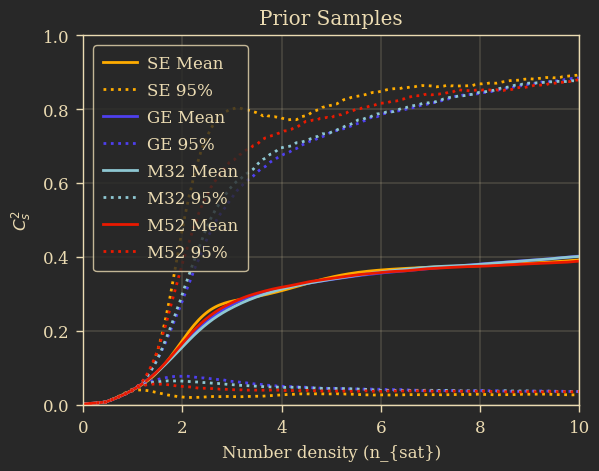

In [16]:
n = anal.get_n_test(10, 200)

# Get stats for prior samples
mean_cs2_se, cs2_16_se, cs2_84_se, cs2_025_se, cs2_975_se = get_stats(eos_se[2])
mean_cs2_ge, cs2_16_ge, cs2_84_ge, cs2_025_ge, cs2_975_ge = get_stats(eos_ge[2])
mean_cs2_m32, cs2_16_m32, cs2_84_m32, cs2_025_m32, cs2_975_m32 = get_stats(eos_m32[2])
mean_cs2_m52, cs2_16_m52, cs2_84_m52, cs2_025_m52, cs2_975_m52 = get_stats(eos_m52[2])

# Plot prior means
plt.plot(n, mean_cs2_se, color="#ffac00", label='SE Mean')
plt.plot(n, mean_cs2_ge, color="#4e3fee", label='GE Mean')
plt.plot(n, mean_cs2_m32, color="#8EC7D2", label='M32 Mean')
plt.plot(n, mean_cs2_m52, color="#ea1900", label='M52 Mean')

# Plot prior 95% bands
plt.plot(n, cs2_025_se, color="#ffac00", ls=':', label='SE 95%')
plt.plot(n, cs2_975_se, color="#ffac00", ls=':')
plt.plot(n, cs2_025_ge, color="#4e3fee", ls=':', label='GE 95%')
plt.plot(n, cs2_975_ge, color="#4e3fee", ls=':')
plt.plot(n, cs2_025_m32, color="#8EC7D2", ls=':', label='M32 95%')
plt.plot(n, cs2_975_m32, color="#8EC7D2", ls=':')
plt.plot(n, cs2_025_m52, color="#ea1900", ls=':', label='M52 95%')
plt.plot(n, cs2_975_m52, color="#ea1900", ls=':')

legend_handles = [
    Line2D([0], [0], color="#ffac00", label='SE Mean'),
    Line2D([0], [0], color="#ffac00", ls=':', label='SE 95%'),
    Line2D([0], [0], color="#4e3fee", label='GE Mean'),
    Line2D([0], [0], color="#4e3fee", ls=':', label='GE 95%'),
    Line2D([0], [0], color="#8EC7D2", label='M32 Mean'),
    Line2D([0], [0], color="#8EC7D2", ls=':', label='M32 95%'),
    Line2D([0], [0], color="#ea1900", label='M52 Mean'),
    Line2D([0], [0], color="#ea1900", ls=':', label='M52 95%'),
]

plt.title("Prior Samples")
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"$C_{s}^{2}$")
plt.xlim(n[0], n[-1])
plt.ylim(0, 1)
plt.legend(handles=legend_handles, loc='upper left')
theme.apply_transforms()
plt.show()

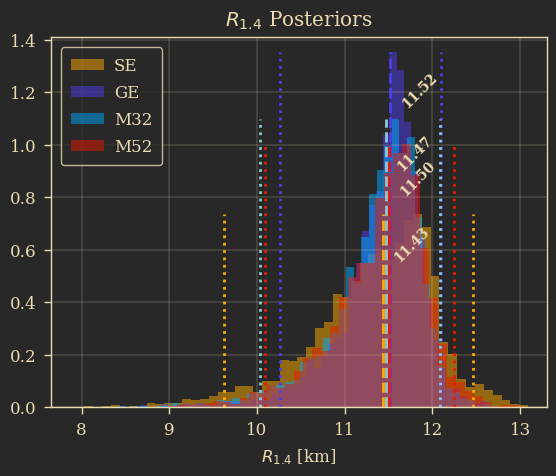

In [17]:
se_hist, se_bins, _ = plt.hist(df_se["r_1.4"].dropna(), bins=50, density=True, alpha=0.5, color='#ffac00', label='SE')
ge_hist, ge_bins, _ = plt.hist(df_ge["r_1.4"].dropna(), bins=50, density=True, alpha=0.5, color='#4e3fee', label='GE')
m32_hist, m32_bins, _ = plt.hist(df_m32["r_1.4"].dropna(), bins=50, density=True, alpha=0.5, color='#00aaff', label='M32')
m52_hist, m52_bins, _ = plt.hist(df_m52["r_1.4"].dropna(), bins=50, density=True, alpha=0.5, color='#ea1900', label='M52')

se_median = np.median(df_se["r_1.4"].dropna())
ge_median = np.median(df_ge["r_1.4"].dropna())
m32_median = np.median(df_m32["r_1.4"].dropna())
m52_median = np.median(df_m52["r_1.4"].dropna())

plt.vlines(se_median, ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls='--')
plt.vlines(ge_median, ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls='--')
plt.vlines(m32_median, ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls='--')
plt.vlines(m52_median, ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls='--')

plt.vlines(np.percentile(df_se["r_1.4"].dropna(), 2.5), ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls=':')
plt.vlines(np.percentile(df_se["r_1.4"].dropna(), 97.5), ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls=':')
plt.vlines(np.percentile(df_ge["r_1.4"].dropna(), 2.5), ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls=':')
plt.vlines(np.percentile(df_ge["r_1.4"].dropna(), 97.5), ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls=':')
plt.vlines(np.percentile(df_m32["r_1.4"].dropna(), 2.5), ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls=':')
plt.vlines(np.percentile(df_m32["r_1.4"].dropna(), 97.5), ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls=':')
plt.vlines(np.percentile(df_m52["r_1.4"].dropna(), 2.5), ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls=':')
plt.vlines(np.percentile(df_m52["r_1.4"].dropna(), 97.5), ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls=':')

plt.annotate(f"{se_median:.2f}", xy=(se_median, se_hist.max()), xytext=(se_median+0.1, se_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{ge_median:.2f}", xy=(ge_median, ge_hist.max()), xytext=(ge_median+0.1, ge_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{m32_median:.2f}", xy=(m32_median, m32_hist.max()), xytext=(m32_median+0.1, m32_hist.max()*0.95),
                color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{m52_median:.2f}", xy=(m52_median, m52_hist.max()), xytext=(m52_median+0.1, m52_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')

plt.xlabel(r"$R_{1.4}$ [km]")
plt.title(r"$R_{1.4}$ Posteriors")
plt.legend()
plt.show()

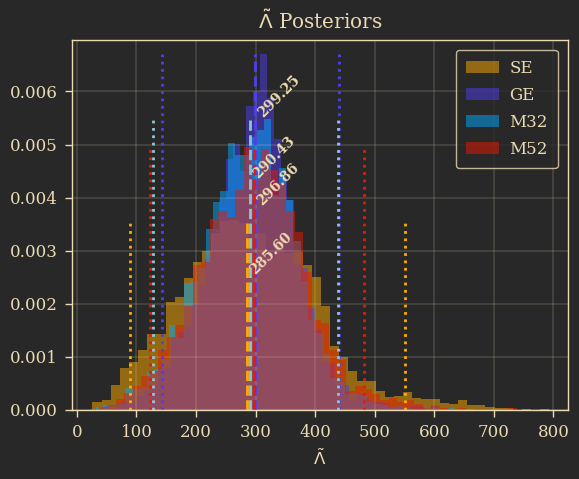

In [18]:
se_hist, se_bins, _ = plt.hist(df_se["lam_tilde"].dropna(), bins=50, density=True, alpha=0.5, color='#ffac00', label='SE')
ge_hist, ge_bins, _ = plt.hist(df_ge["lam_tilde"].dropna(), bins=50, density=True, alpha=0.5, color='#4e3fee', label='GE')
m32_hist, m32_bins, _ = plt.hist(df_m32["lam_tilde"].dropna(), bins=50, density=True, alpha=0.5, color='#00aaff', label='M32')
m52_hist, m52_bins, _ = plt.hist(df_m52["lam_tilde"].dropna(), bins=50, density=True, alpha=0.5, color='#ea1900', label='M52')

se_median = np.median(df_se["lam_tilde"].dropna())
ge_median = np.median(df_ge["lam_tilde"].dropna())
m32_median = np.median(df_m32["lam_tilde"].dropna())
m52_median = np.median(df_m52["lam_tilde"].dropna())

plt.vlines(se_median, ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls='--')
plt.vlines(ge_median, ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls='--')
plt.vlines(m32_median, ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls='--')
plt.vlines(m52_median, ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls='--')

plt.vlines(np.percentile(df_se["lam_tilde"].dropna(), 2.5), ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls=':')
plt.vlines(np.percentile(df_se["lam_tilde"].dropna(), 97.5), ymin=se_hist.min(), ymax=se_hist.max(), color='#ffac00', ls=':')
plt.vlines(np.percentile(df_ge["lam_tilde"].dropna(), 2.5), ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls=':')
plt.vlines(np.percentile(df_ge["lam_tilde"].dropna(), 97.5), ymin=ge_hist.min(), ymax=ge_hist.max(), color='#4e3fee', ls=':')
plt.vlines(np.percentile(df_m32["lam_tilde"].dropna(), 2.5), ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls=':')
plt.vlines(np.percentile(df_m32["lam_tilde"].dropna(), 97.5), ymin=m32_hist.min(), ymax=m32_hist.max(), color='#8EC7D2', ls=':')
plt.vlines(np.percentile(df_m52["lam_tilde"].dropna(), 2.5), ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls=':')
plt.vlines(np.percentile(df_m52["lam_tilde"].dropna(), 97.5), ymin=m52_hist.min(), ymax=m52_hist.max(), color='#ea1900', ls=':')

plt.annotate(f"{se_median:.2f}", xy=(se_median, se_hist.max()), xytext=(se_median+0.1, se_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{ge_median:.2f}", xy=(ge_median, ge_hist.max()), xytext=(ge_median+0.1, ge_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{m32_median:.2f}", xy=(m32_median, m32_hist.max()), xytext=(m32_median+0.1, m32_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')
plt.annotate(f"{m52_median:.2f}", xy=(m52_median, m52_hist.max()), xytext=(m52_median+0.1, m52_hist.max()*0.95),
             color='#ebdbb2', fontsize=10, rotation=45, va='top', ha='left', fontweight='bold')

plt.xlabel(r"$\tilde{\Lambda}$")
plt.title(r"$\tilde{\Lambda}$ Posteriors")
plt.legend()
plt.show()

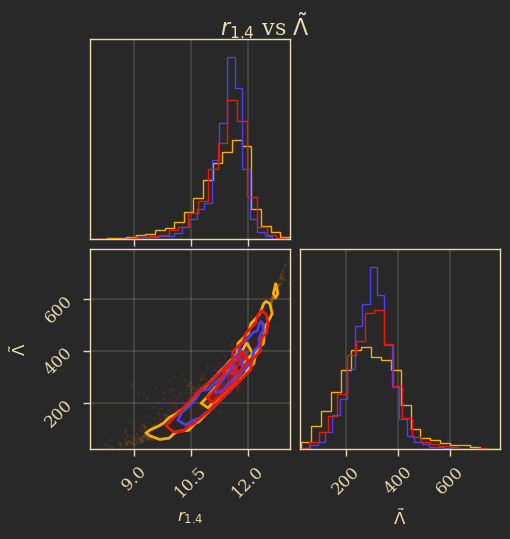

In [19]:
import corner

params = ["r_1.4", "lam_tilde"]
labels = [r"$r_{1.4}$", r"$\tilde{\Lambda}$"]

df_se_clean = df_se[params].dropna()
df_ge_clean = df_ge[params].dropna()
df_m52_clean = df_m52[params].dropna()

figure = corner.corner(
    df_se_clean,
    labels=labels,
    color='#ffac00',
    plot_contours=True,
    fill_contours=False,
    levels=[0.68, 0.95],
    label_kwargs={"fontsize": 12},
    hist_kwargs={"density": True, "alpha": 1},
    figsize=(12, 12),
)

corner.corner(
    df_ge_clean,
    labels=labels,
    color='#4e3fee',
    fig=figure,
    plot_contours=True,
    fill_contours=False,
    levels=[0.68, 0.95],
    label_kwargs={"fontsize": 12},
    hist_kwargs={"density": True, "alpha": 1},
    figsize=(12, 12),
)


corner.corner(
    df_m52_clean,
    labels=labels,
    color='#ea1900',
    fig=figure,
    plot_contours=True,
    fill_contours=False,
    levels=[0.68, 0.95],
    label_kwargs={"fontsize": 12},
    hist_kwargs={"density": True, "alpha": 1},
    figsize=(12, 12),
)

plt.suptitle("$r_{1.4}$ vs $\\tilde{\\Lambda}$", fontsize=16)
plt.show()
theme.apply_transforms()

# get lambda tilde

In [3]:
m = mr_se[1]
tide = mr_se[2]

valid_eos = pa.get_valid_eos(df_se)
m_from_valid_eos = m[valid_eos]
tide_from_valid_eos = tide[valid_eos]

tide1 = np.zeros_like(df_se['m1'])
tide2 = np.zeros_like(df_se['m2'])

for i in range(len(m)):
    valid_mask = ~np.isnan(m[i]) # unstable branch has NaN mass
    m_valid = m[i][valid_mask]
    tide_valid = tide[i][valid_mask]
    
    if (len(m_valid) > 1 
        and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid))
        and i in valid_eos):  # if eos reaches 1.4
        idx = df_se.index[df_se['EOS'] == i][0]
        m1val = df_se['m1'][idx]
        tide1[idx] = np.interp(df_se['m1'][idx], m_valid, tide_valid)
        tide2[idx] = np.interp(df_se['m2'][idx], m_valid, tide_valid)


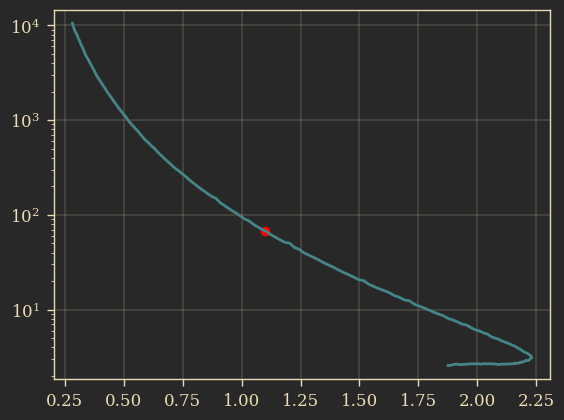

In [4]:
i = valid_eos[-1]

valid_mask = ~np.isnan(m[i]) # unstable branch has NaN mass
m_valid = m[i][valid_mask]
tide_valid = tide[i][valid_mask]

if (len(m_valid) > 1 
    and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid))
    and i in valid_eos):  # if eos reaches 1.4
    idx = df_se.index[df_se['EOS'] == i][0]
    m1val = df_se['m1'][idx]
    tide1 = np.interp(df_se['m1'][idx], m_valid, tide_valid)
    tide2 = np.interp(df_se['m2'][idx], m_valid, tide_valid)


plt.plot(m_valid, tide_valid)
plt.scatter(m1val, tide1, color='red', label='m1')
plt.yscale('log')
plt.show()

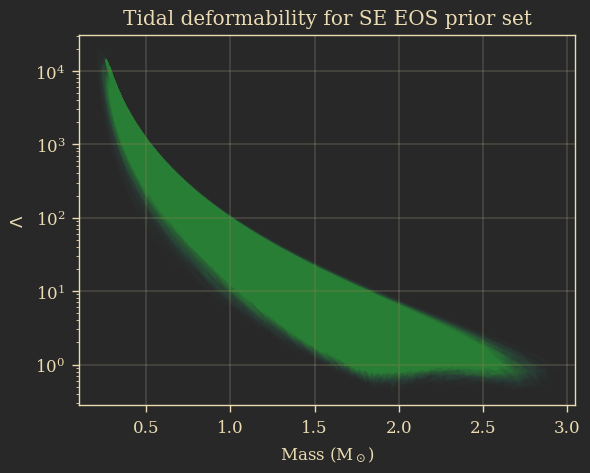

In [6]:
for i in range(len(m)):
    plt.plot(m[i], tide[i], color='#4ad389', alpha=0.01)


plt.yscale('log')
plt.xlabel('Mass (M$_\odot$)')
plt.ylabel(r"${\Lambda}$")
plt.title('Tidal deformability for SE EOS prior set')
plt.show()

# lengthscale comparison

In [118]:
l_se = np.load("/home/sam/thesis/code/results/eos_samples/little_guys/SE_lengthscale.npy")
l_m32 = np.load("/home/sam/thesis/code/results/eos_samples/little_guys/M32_lengthscale.npy")

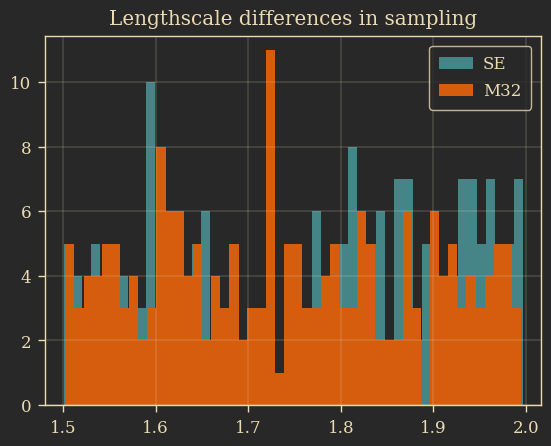

In [131]:
plt.hist(l_se, bins=50, label='SE')
plt.hist(l_m32/1.27575, bins=50, label='M32')
plt.legend()
plt.title("Lengthscale differences in sampling")
plt.show()

In [182]:
nceft_end_se = np.load("/home/sam/thesis/code/results/eos_samples/little_guys/SE_nceft_end.npy")
nceft_end_m52 = np.load("/home/sam/thesis/code/results/eos_samples/little_guys/M52_nceft_end.npy")

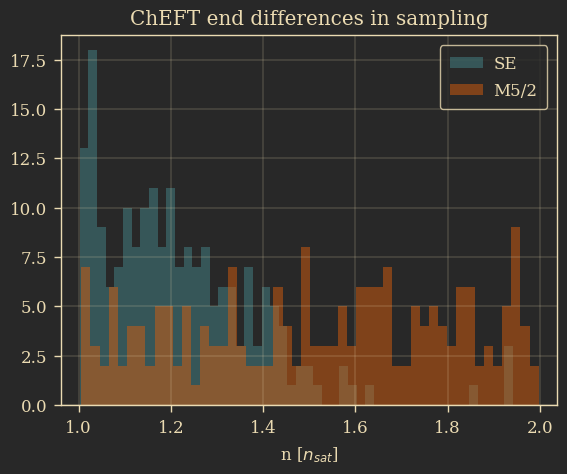

In [183]:
plt.hist(nceft_end_se, bins=50, label='SE', alpha=0.5)
plt.hist(nceft_end_m52, bins=50, label='M5/2', alpha=0.5)
plt.legend()
plt.title("ChEFT end differences in sampling")
plt.xlabel("n [$n_{sat}$]")
plt.show()